# Prediction System for Spreading of Coronavirus 

In [1]:
import numpy as np 
import matplotlib.pyplot as plt 
import matplotlib.colors as mcolors
import pandas as pd 
import random
import math
import time
from sklearn.linear_model import LinearRegression, BayesianRidge
from sklearn.model_selection import RandomizedSearchCV, train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, mean_absolute_error
import datetime
import operator 
plt.style.use('fivethirtyeight')
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

dataset

In [2]:
confirmed_df = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv')
deaths_df = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv')
recoveries_df = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_recovered_global.csv')
latest_data = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports/11-26-2020.csv')
us_medical_data = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports_us/11-26-2020.csv')
#apple_mobility = pd.read_csv('https://covid19-static.cdn-apple.com/covid19-mobility-data/2021HotfixDev26/v3/en-us/applemobilitytrends-2020-11-26.csv')

In [3]:
latest_data.head(10)

,FIPS,Admin2,Province_State,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,Combined_Key,Incident_Rate,Case_Fatality_Ratio
0,NaN,NaN,NaN,Afghanistan,2020-11-27 05:26:53,33.93911,67.709953,45600,1737,36232,7747.0,Afghanistan,117.436291,3.799545
1,NaN,NaN,NaN,Albania,2020-11-27 05:26:53,41.15330,20.168300,35600,753,17352,17495.0,Albania,1237.056085,2.115169
2,NaN,NaN,NaN,Algeria,2020-11-27 05:26:53,28.03390,1.659600,79110,2352,51334,25424.0,Algeria,180.406199,2.973075
3,NaN,NaN,NaN,Andorra,2020-11-27 05:26:53,42.50630,1.521800,6534,76,5649,809.0,Andorra,8456.610367,1.163147
4,NaN,NaN,NaN,Angola,2020-11-27 05:26:53,-11.20270,17.873900,14920,341,7617,6962.0,Angola,45.396088,2.285523
5,NaN,NaN,NaN,Antigua and Barbuda,2020-11-27 05:26:53,17.06080,-61.796400,141,4,130,7.0,Antigua and Barbuda,143.983335,2.836879
6,NaN,NaN,NaN,Argentina,2020-11-27 05:26:53,-38.41610,-63.616700,1399431,37941,1226662,134828.0,Argentina,3096.375575,2.711173
7,NaN,NaN,NaN,Armenia,2020-11-27 05:26:53,40.06910,45.038200,130870,2068,103055,25747.0,Armenia,4416.458504,1.580194
8,NaN,NaN,Australian Capital Territory,Australia,2020-11-27 05:26:53,-35.47350,149.012400,116,3,112,1.0,"Australian Capital Territory, Australia",27.096473,2.586207
9,NaN,NaN,New South Wales,Australia,2020-11-27 05:26:53,-33.86880,151.209300,4556,53,0,1323.0,"New South Wales, Australia",56.122198,1.163301


In [4]:
confirmed_df.head(10)

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,5/12/21,5/13/21,5/14/21,5/15/21,5/16/21,5/17/21,5/18/21,5/19/21,5/20/21,5/21/21
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,...,62718,63045,63355,63412,63484,63598,63819,64122,64575,65080
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,...,131845,131890,131939,131978,132015,132032,132071,132095,132118,132153
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,...,124682,124889,125059,125194,125311,125485,125693,125896,126156,126434
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,...,13470,13470,13510,13510,13510,13555,13569,13569,13569,13569
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,...,29405,29695,30030,30354,30637,30787,31045,31438,31661,31909
5,NaN,Antigua and Barbuda,17.06080,-61.796400,0,0,0,0,0,0,...,1240,1240,1240,1241,1241,1251,1251,1252,1255,1255
6,NaN,Argentina,-38.41610,-63.616700,0,0,0,0,0,0,...,3215572,3242103,3269466,3290935,3307285,3335965,3371508,3411160,3447044,3482512
7,NaN,Armenia,40.06910,45.038200,0,0,0,0,0,0,...,219950,220217,220447,220729,220860,220927,221139,221368,221559,221699
8,Australian Capital Territory,Australia,-35.47350,149.012400,0,0,0,0,0,0,...,124,124,124,124,124,124,124,124,124,124
9,New South Wales,Australia,-33.86880,151.209300,0,0,0,0,3,4,...,5551,5552,5555,5558,5560,5563,5565,5567,5567,5568


In [5]:
us_medical_data.head(10)

,Province_State,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,FIPS,Incident_Rate,Total_Test_Results,People_Hospitalized,Case_Fatality_Ratio,UID,ISO3,Testing_Rate,Hospitalization_Rate
0,Alabama,US,2020-11-27 05:30:26,32.3182,-86.9023,241957,3572,161946.0,76439.0,1.0,4934.690410,1562942.0,NaN,1.476295,84000001.0,USA,31876.056074,NaN
1,Alaska,US,2020-11-27 05:30:26,61.3707,-152.4044,30121,120,7165.0,22818.0,2.0,4114.852812,969573.0,NaN,0.395323,84000002.0,USA,132537.711282,NaN
2,American Samoa,US,2020-11-27 05:30:26,-14.2710,-170.1320,0,0,NaN,0.0,60.0,0.000000,1988.0,NaN,NaN,16.0,ASM,3572.904872,NaN
3,Arizona,US,2020-11-27 05:30:26,33.7298,-111.4312,314324,6568,50352.0,257404.0,4.0,4318.398421,3719276.0,NaN,2.089564,84000004.0,USA,29932.266909,NaN
4,Arkansas,US,2020-11-27 05:30:26,34.9697,-92.3731,152625,2436,132580.0,17609.0,5.0,5057.485509,1647144.0,NaN,1.596069,84000005.0,USA,54580.880667,NaN
5,California,US,2020-11-27 05:30:26,36.1162,-119.6816,1181614,19122,NaN,1152777.0,6.0,2965.669636,23096745.0,NaN,1.623568,84000006.0,USA,58454.683757,NaN
6,Colorado,US,2020-11-27 05:30:26,39.0598,-105.3111,216683,2957,11782.0,201944.0,8.0,3762.683339,3046149.0,NaN,1.364666,84000008.0,USA,52896.139014,NaN
7,Connecticut,US,2020-11-27 05:30:26,41.5978,-72.7554,109152,4926,9800.0,94426.0,9.0,3061.520713,3083113.0,NaN,4.512973,84000009.0,USA,86475.871367,NaN
8,Delaware,US,2020-11-27 05:30:26,39.3185,-75.5071,33579,805,16712.0,16106.0,10.0,3448.371474,705587.0,NaN,2.266297,84000010.0,USA,72459.754109,NaN
9,Diamond Princess,US,2020-11-27 05:30:26,NaN,NaN,49,0,NaN,49.0,88888.0,NaN,NaN,NaN,0.000000,84088888.0,USA,NaN,NaN


In [6]:
cols = confirmed_df.keys()


Get all the dates for the outbreak

In [7]:
confirmed = confirmed_df.loc[:, cols[4]:cols[-1]]
deaths = deaths_df.loc[:, cols[4]:cols[-1]]
recoveries = recoveries_df.loc[:, cols[4]:cols[-1]]

In [8]:
dates = confirmed.keys()
world_cases = []
total_deaths = [] 
mortality_rate = []
recovery_rate = [] 
total_recovered = [] 
total_active = [] 

for i in dates:
    confirmed_sum = confirmed[i].sum()
    death_sum = deaths[i].sum()
    recovered_sum = recoveries[i].sum()
    
    # confirmed, deaths, recovered, and active
    world_cases.append(confirmed_sum)
    total_deaths.append(death_sum)
    total_recovered.append(recovered_sum)
    total_active.append(confirmed_sum-death_sum-recovered_sum)
    
    # calculate rates
    mortality_rate.append(death_sum/confirmed_sum)
    recovery_rate.append(recovered_sum/confirmed_sum)

Getting daily increases and moving averages

In [9]:
def daily_increase(data):
    d = [] 
    for i in range(len(data)):
        if i == 0:
            d.append(data[0])
        else:
            d.append(data[i]-data[i-1])
    return d 

def moving_average(data, window_size):
    moving_average = []
    for i in range(len(data)):
        if i + window_size < len(data):
            moving_average.append(np.mean(data[i:i+window_size]))
        else:
            moving_average.append(np.mean(data[i:len(data)]))
    return moving_average

# window size
window = 7

# confirmed cases
world_daily_increase = daily_increase(world_cases)
world_confirmed_avg= moving_average(world_cases, window)
world_daily_increase_avg = moving_average(world_daily_increase, window)

# deaths
world_daily_death = daily_increase(total_deaths)
world_death_avg = moving_average(total_deaths, window)
world_daily_death_avg = moving_average(world_daily_death, window)


# recoveries
world_daily_recovery = daily_increase(total_recovered)
world_recovery_avg = moving_average(total_recovered, window)
world_daily_recovery_avg = moving_average(world_daily_recovery, window)


# active 
world_active_avg = moving_average(total_active, window)

In [10]:
days_since_1_22 = np.array([i for i in range(len(dates))]).reshape(-1, 1)
world_cases = np.array(world_cases).reshape(-1, 1)
total_deaths = np.array(total_deaths).reshape(-1, 1)
total_recovered = np.array(total_recovered).reshape(-1, 1)

# Future forcasting

In [11]:
days_in_future = 10
future_forcast = np.array([i for i in range(len(dates)+days_in_future)]).reshape(-1, 1)
adjusted_dates = future_forcast[:-10]

Convert integer into datetime for better visualization

In [12]:
start = '1/22/2020'
start_date = datetime.datetime.strptime(start, '%m/%d/%Y')
future_forcast_dates = []
for i in range(len(future_forcast)):
    future_forcast_dates.append((start_date + datetime.timedelta(days=i)).strftime('%m/%d/%Y'))

In [13]:
# slightly modify the data to fit the model better (regression models cannot pick the pattern)
X_train_confirmed, X_test_confirmed, y_train_confirmed, y_test_confirmed = train_test_split(days_since_1_22[50:], world_cases[50:], test_size=0.05, shuffle=False) 

Model for predicting # of confirmed cases. I am using support vector machine, bayesian ridge , and linear regression in this example. We will show the results in the later section. 

In [14]:
# # use this to find the optimal parameters for SVR
# c = [0.01, 0.1, 1]
# gamma = [0.01, 0.1, 1]
# epsilon = [0.01, 0.1, 1]
# shrinking = [True, False]

# svm_grid = {'C': c, 'gamma' : gamma, 'epsilon': epsilon, 'shrinking' : shrinking}

# svm = SVR(kernel='poly', degree=3)
# svm_search = RandomizedSearchCV(svm, svm_grid, scoring='neg_mean_squared_error', cv=3, return_train_score=True, n_jobs=-1, n_iter=30, verbose=1)
# svm_search.fit(X_train_confirmed, y_train_confirmed)

In [15]:
# svm_search.best_params_

In [16]:
# svm_confirmed = svm_search.best_estimator_
svm_confirmed = SVR(shrinking=True, kernel='poly',gamma=0.01, epsilon=1,degree=3, C=0.1)
svm_confirmed.fit(X_train_confirmed, y_train_confirmed)
svm_pred = svm_confirmed.predict(future_forcast)

MAE: 29755849.946469054
MSE: 893777506428619.6


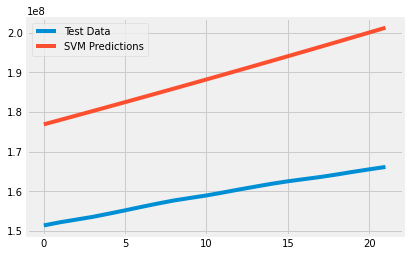

In [17]:
# check against testing data
svm_test_pred = svm_confirmed.predict(X_test_confirmed)
plt.plot(y_test_confirmed)
plt.plot(svm_test_pred)
plt.legend(['Test Data', 'SVM Predictions'])
print('MAE:', mean_absolute_error(svm_test_pred, y_test_confirmed))
print('MSE:',mean_squared_error(svm_test_pred, y_test_confirmed))

In [18]:
# transform our data for polynomial regression
poly = PolynomialFeatures(degree=4)
poly_X_train_confirmed = poly.fit_transform(X_train_confirmed)
poly_X_test_confirmed = poly.fit_transform(X_test_confirmed)
poly_future_forcast = poly.fit_transform(future_forcast)

bayesian_poly = PolynomialFeatures(degree=5)
bayesian_poly_X_train_confirmed = bayesian_poly.fit_transform(X_train_confirmed)
bayesian_poly_X_test_confirmed = bayesian_poly.fit_transform(X_test_confirmed)
bayesian_poly_future_forcast = bayesian_poly.fit_transform(future_forcast)

In [19]:
# polynomial regression
linear_model = LinearRegression(normalize=True, fit_intercept=False)
linear_model.fit(poly_X_train_confirmed, y_train_confirmed)
test_linear_pred = linear_model.predict(poly_X_test_confirmed)
linear_pred = linear_model.predict(poly_future_forcast)
print('MAE:', mean_absolute_error(test_linear_pred, y_test_confirmed))
print('MSE:',mean_squared_error(test_linear_pred, y_test_confirmed))

MAE: 11844533.831883164
MSE: 148031171534909.56


In [20]:
print(linear_model.coef_)

[[-1.15201378e+07  3.16272127e+05 -2.69833574e+03  1.19108185e+01
  -1.29424703e-02]]


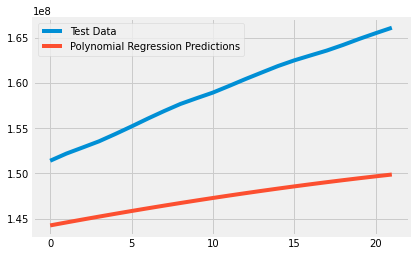

In [21]:
plt.plot(y_test_confirmed)
plt.plot(test_linear_pred)
plt.legend(['Test Data', 'Polynomial Regression Predictions'])

In [22]:
# bayesian ridge polynomial regression
tol = [1e-6, 1e-5, 1e-4, 1e-3, 1e-2]
alpha_1 = [1e-7, 1e-6, 1e-5, 1e-4, 1e-3]
alpha_2 = [1e-7, 1e-6, 1e-5, 1e-4, 1e-3]
lambda_1 = [1e-7, 1e-6, 1e-5, 1e-4, 1e-3]
lambda_2 = [1e-7, 1e-6, 1e-5, 1e-4, 1e-3]
normalize = [True, False]

bayesian_grid = {'tol': tol, 'alpha_1': alpha_1, 'alpha_2' : alpha_2, 'lambda_1': lambda_1, 'lambda_2' : lambda_2, 
                 'normalize' : normalize}

bayesian = BayesianRidge(fit_intercept=False)
bayesian_search = RandomizedSearchCV(bayesian, bayesian_grid, scoring='neg_mean_squared_error', cv=3, return_train_score=True, n_jobs=-1, n_iter=40, verbose=1)
bayesian_search.fit(bayesian_poly_X_train_confirmed, y_train_confirmed)

Fitting 3 folds for each of 40 candidates, totalling 120 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 120 out of 120 | elapsed:    2.8s finished


RandomizedSearchCV(cv=3, estimator=BayesianRidge(fit_intercept=False),
                   n_iter=40, n_jobs=-1,
                   param_distributions={'alpha_1': [1e-07, 1e-06, 1e-05, 0.0001,
                                                    0.001],
                                        'alpha_2': [1e-07, 1e-06, 1e-05, 0.0001,
                                                    0.001],
                                        'lambda_1': [1e-07, 1e-06, 1e-05,
                                                     0.0001, 0.001],
                                        'lambda_2': [1e-07, 1e-06, 1e-05,
                                                     0.0001, 0.001],
                                        'normalize': [True, False],
                                        'tol': [1e-06, 1e-05, 0.0001, 0.001,
                                                0.01]},
                   return_train_score=True, scoring='neg_mean_squared_error',
                   verbose=1)

In [23]:
bayesian_search.best_params_

{'tol': 0.001,
 'normalize': False,
 'lambda_2': 1e-05,
 'lambda_1': 0.001,
 'alpha_2': 1e-07,
 'alpha_1': 1e-07}

In [24]:
bayesian_confirmed = bayesian_search.best_estimator_
test_bayesian_pred = bayesian_confirmed.predict(bayesian_poly_X_test_confirmed)
bayesian_pred = bayesian_confirmed.predict(bayesian_poly_future_forcast)
print('MAE:', mean_absolute_error(test_bayesian_pred, y_test_confirmed))
print('MSE:',mean_squared_error(test_bayesian_pred, y_test_confirmed))

MAE: 10753728.666086314
MSE: 122155690717161.52


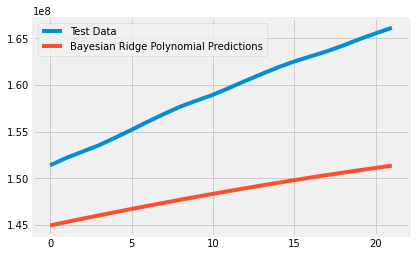

In [25]:
plt.plot(y_test_confirmed)
plt.plot(test_bayesian_pred)
plt.legend(['Test Data', 'Bayesian Ridge Polynomial Predictions'])

#  Graphing the number of confirmed cases, active cases, deaths, recoveries, mortality rate (CFR), and recovery rate
 <a id='world_wide_graphs'></a>

In [26]:
# helper method for flattening the data, so it can be displayed on a bar graph 
def flatten(arr):
    a = [] 
    arr = arr.tolist()
    for i in arr:
        a.append(i[0])
    return a

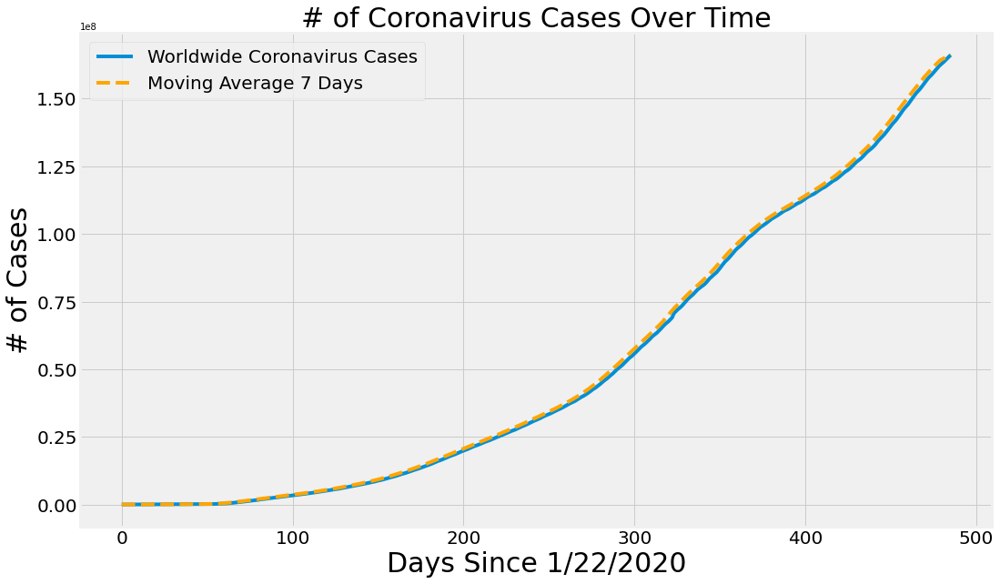

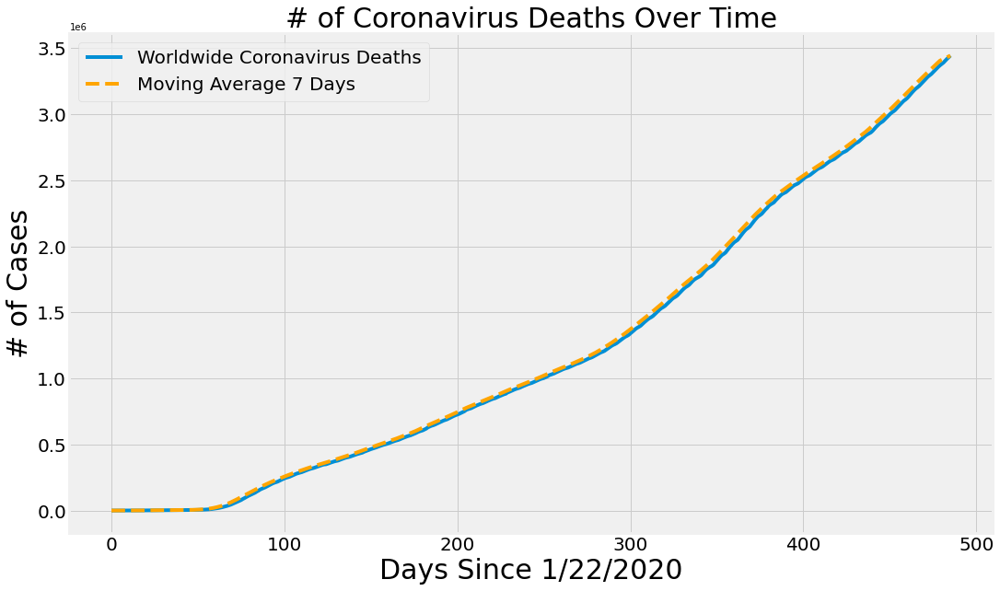

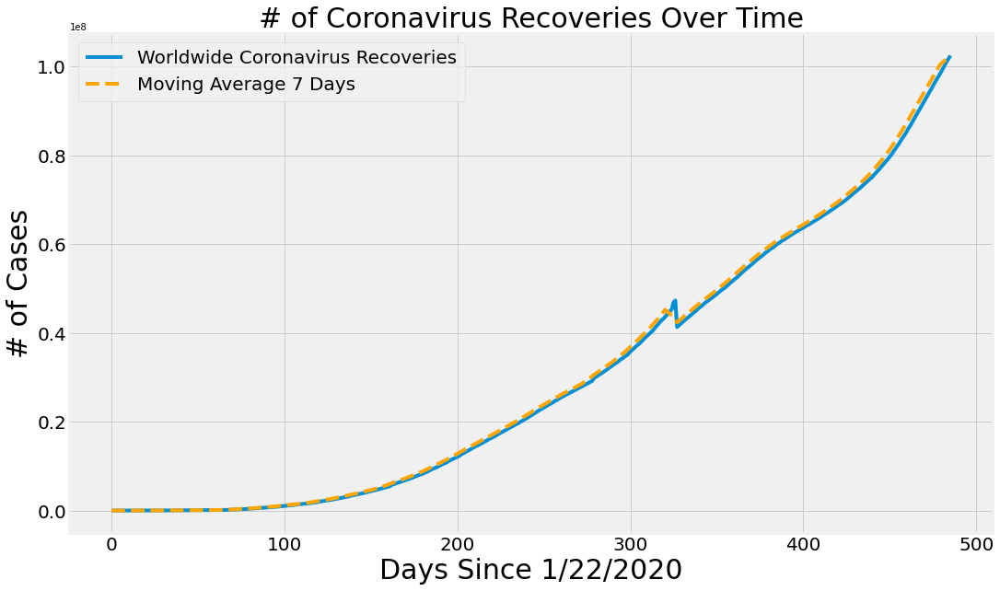

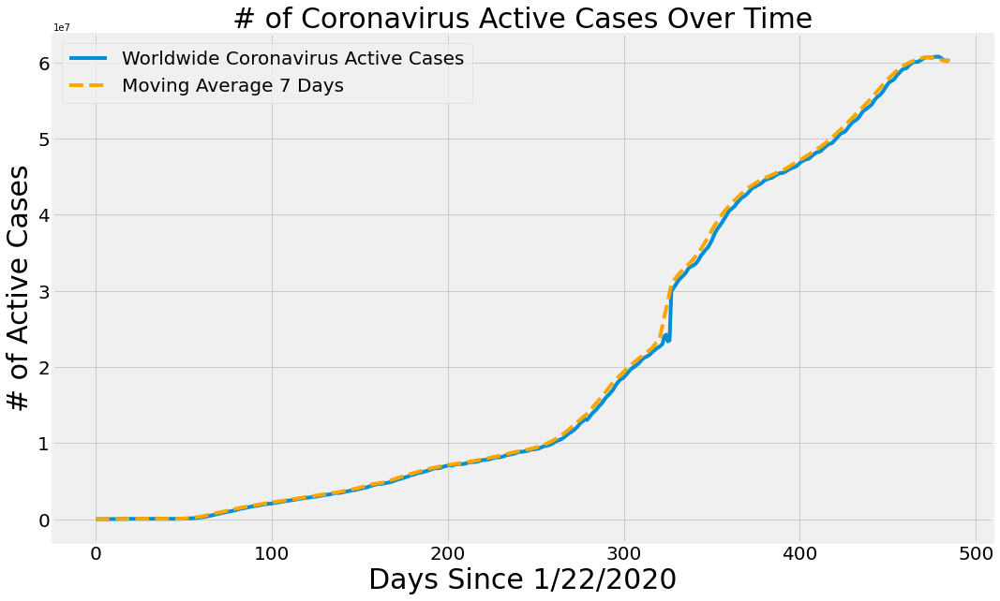

In [27]:
adjusted_dates = adjusted_dates.reshape(1, -1)[0]
plt.figure(figsize=(16, 10))
plt.plot(adjusted_dates, world_cases)
plt.plot(adjusted_dates, world_confirmed_avg, linestyle='dashed', color='orange')
plt.title('# of Coronavirus Cases Over Time', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.legend(['Worldwide Coronavirus Cases', 'Moving Average {} Days'.format(window)], prop={'size': 20})
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

plt.figure(figsize=(16, 10))
plt.plot(adjusted_dates, total_deaths)
plt.plot(adjusted_dates, world_death_avg, linestyle='dashed', color='orange')
plt.title('# of Coronavirus Deaths Over Time', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.legend(['Worldwide Coronavirus Deaths', 'Moving Average {} Days'.format(window)], prop={'size': 20})
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

plt.figure(figsize=(16, 10))
plt.plot(adjusted_dates, total_recovered)
plt.plot(adjusted_dates, world_recovery_avg, linestyle='dashed', color='orange')
plt.title('# of Coronavirus Recoveries Over Time', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.legend(['Worldwide Coronavirus Recoveries', 'Moving Average {} Days'.format(window)], prop={'size': 20})
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

plt.figure(figsize=(16, 10))
plt.plot(adjusted_dates, total_active)
plt.plot(adjusted_dates, world_active_avg, linestyle='dashed', color='orange')
plt.title('# of Coronavirus Active Cases Over Time', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Active Cases', size=30)
plt.legend(['Worldwide Coronavirus Active Cases', 'Moving Average {} Days'.format(window)], prop={'size': 20})
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

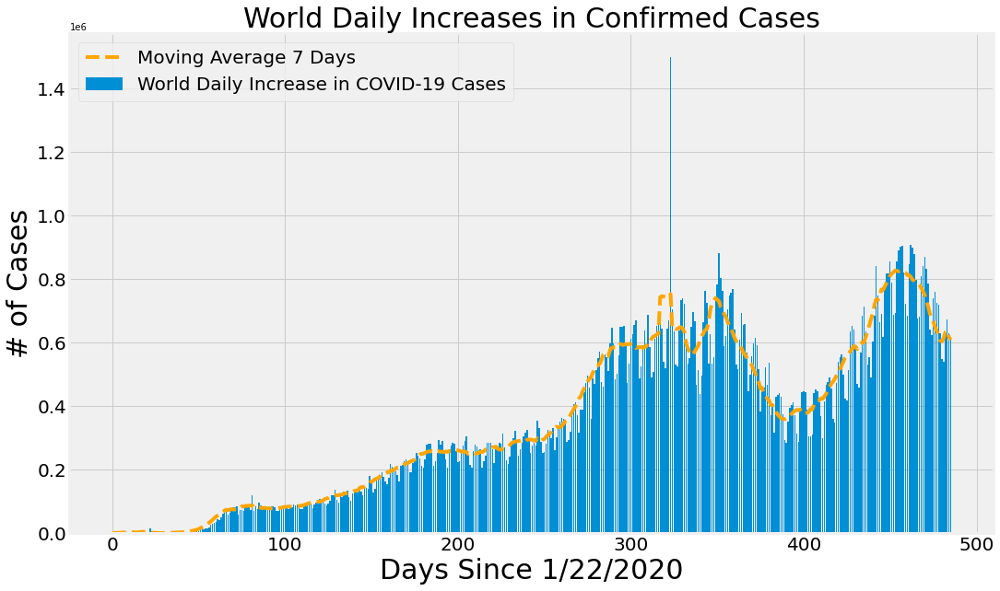

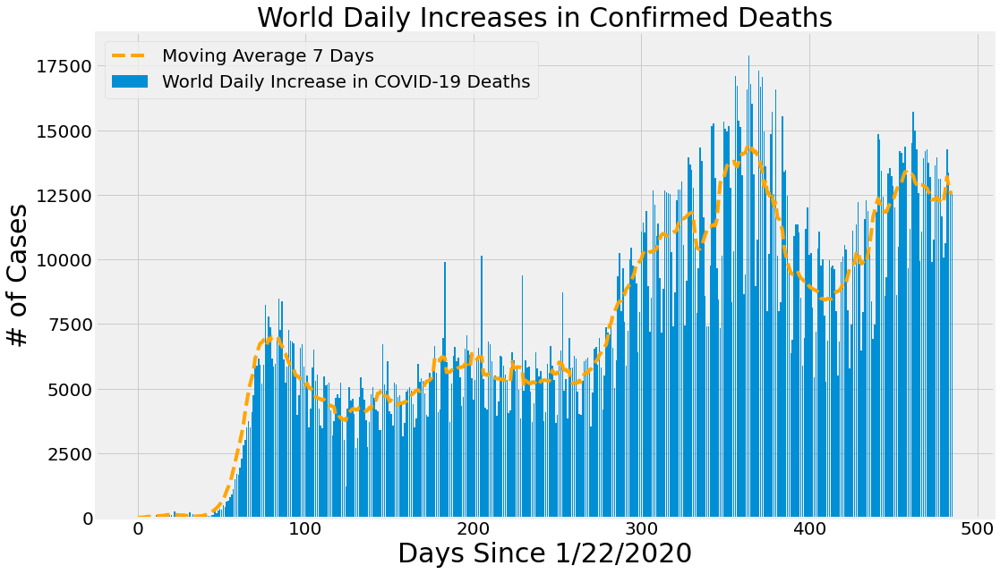

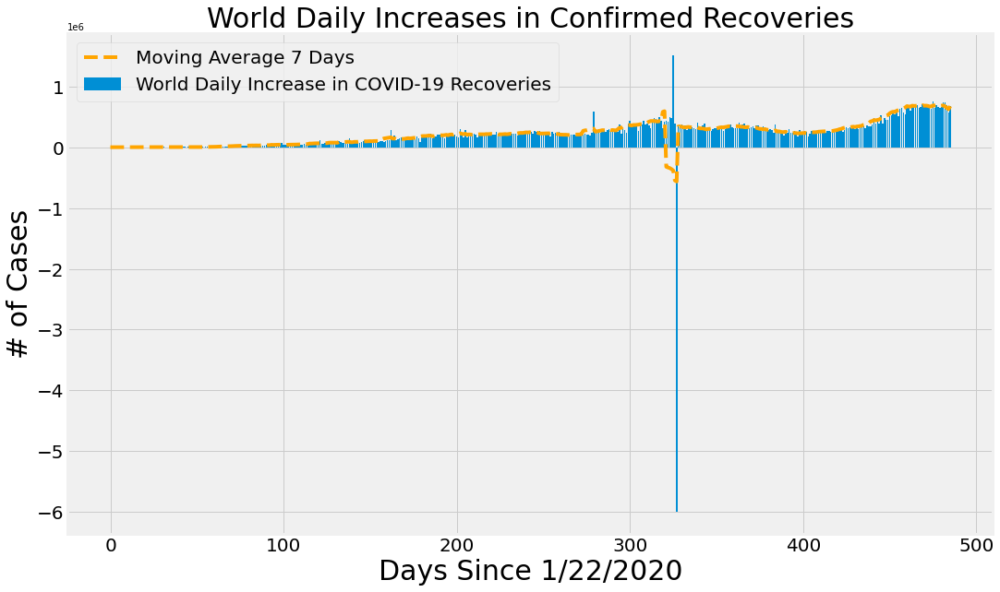

In [28]:
plt.figure(figsize=(16, 10))
plt.bar(adjusted_dates, world_daily_increase)
plt.plot(adjusted_dates, world_daily_increase_avg, color='orange', linestyle='dashed')
plt.title('World Daily Increases in Confirmed Cases', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.legend(['Moving Average {} Days'.format(window), 'World Daily Increase in COVID-19 Cases'], prop={'size': 20})
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

plt.figure(figsize=(16, 10))
plt.bar(adjusted_dates, world_daily_death)
plt.plot(adjusted_dates, world_daily_death_avg, color='orange', linestyle='dashed')
plt.title('World Daily Increases in Confirmed Deaths', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.legend(['Moving Average {} Days'.format(window), 'World Daily Increase in COVID-19 Deaths'], prop={'size': 20})
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

plt.figure(figsize=(16, 10))
plt.bar(adjusted_dates, world_daily_recovery)
plt.plot(adjusted_dates, world_daily_recovery_avg, color='orange', linestyle='dashed')
plt.title('World Daily Increases in Confirmed Recoveries', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.legend(['Moving Average {} Days'.format(window), 'World Daily Increase in COVID-19 Recoveries'], prop={'size': 20})
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

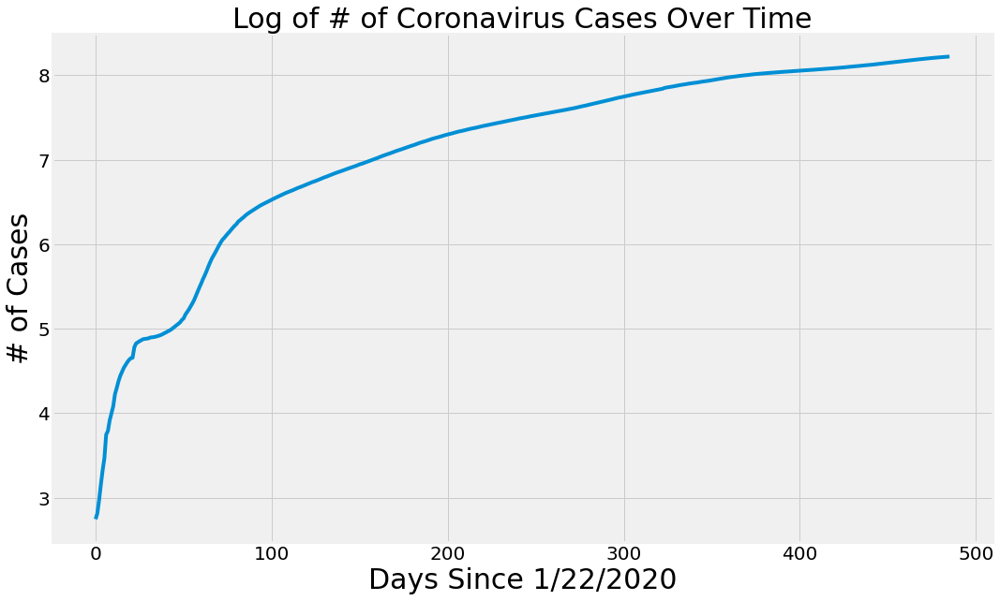

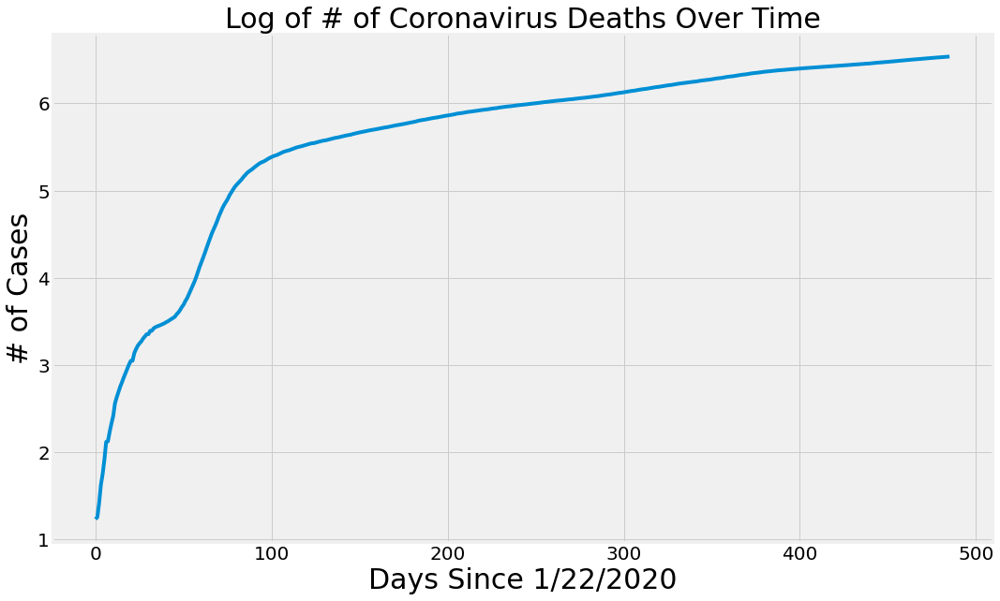

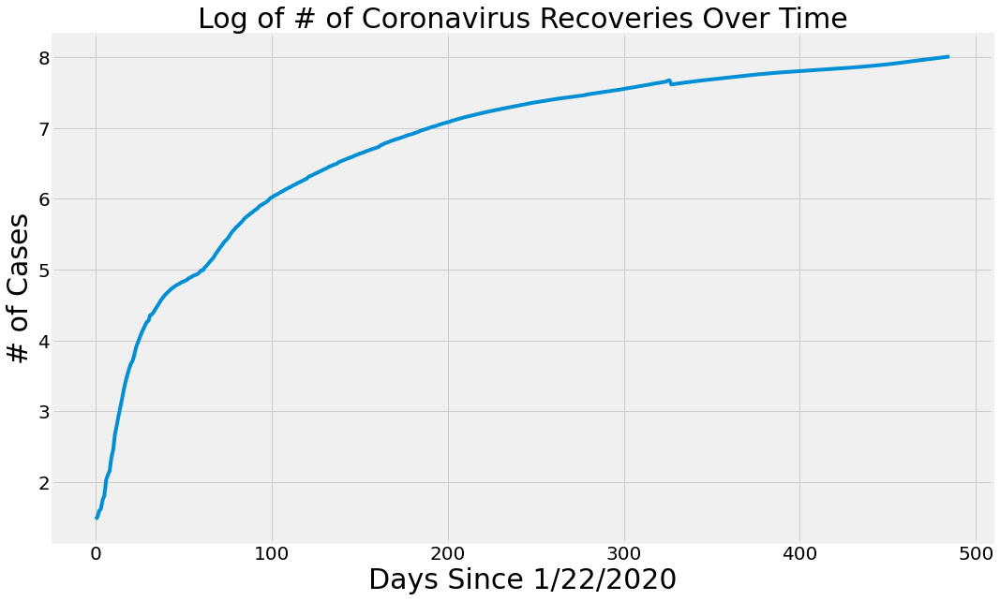

In [29]:
plt.figure(figsize=(16, 10))
plt.plot(adjusted_dates, np.log10(world_cases))
plt.title('Log of # of Coronavirus Cases Over Time', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

plt.figure(figsize=(16, 10))
plt.plot(adjusted_dates, np.log10(total_deaths))
plt.title('Log of # of Coronavirus Deaths Over Time', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

plt.figure(figsize=(16, 10))
plt.plot(adjusted_dates, np.log10(total_recovered))
plt.title('Log of # of Coronavirus Recoveries Over Time', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

In [30]:
def country_plot(x, y1, y2, y3, y4, country):
    # window is set as 14 in in the beginning of the notebook 
    confirmed_avg = moving_average(y1, window)
    confirmed_increase_avg = moving_average(y2, window)
    death_increase_avg = moving_average(y3, window)
    recovery_increase_avg = moving_average(y4, window)
    
    plt.figure(figsize=(16, 10))
    plt.plot(x, y1)
    plt.plot(x, confirmed_avg, color='red', linestyle='dashed')
    plt.legend(['{} Confirmed Cases'.format(country), 'Moving Average {} Days'.format(window)], prop={'size': 20})
    plt.title('{} Confirmed Cases'.format(country), size=30)
    plt.xlabel('Days Since 1/22/2020', size=30)
    plt.ylabel('# of Cases', size=30)
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()

    plt.figure(figsize=(16, 10))
    plt.bar(x, y2)
    plt.plot(x, confirmed_increase_avg, color='red', linestyle='dashed')
    plt.legend(['Moving Average {} Days'.format(window), '{} Daily Increase in Confirmed Cases'.format(country)], prop={'size': 20})
    plt.title('{} Daily Increases in Confirmed Cases'.format(country), size=30)
    plt.xlabel('Days Since 1/22/2020', size=30)
    plt.ylabel('# of Cases', size=30)
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()

    plt.figure(figsize=(16, 10))
    plt.bar(x, y3)
    plt.plot(x, death_increase_avg, color='red', linestyle='dashed')
    plt.legend(['Moving Average {} Days'.format(window), '{} Daily Increase in Confirmed Deaths'.format(country)], prop={'size': 20})
    plt.title('{} Daily Increases in Deaths'.format(country), size=30)
    plt.xlabel('Days Since 1/22/2020', size=30)
    plt.ylabel('# of Cases', size=30)
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()

    plt.figure(figsize=(16, 10))
    plt.bar(x, y4)
    plt.plot(x, recovery_increase_avg, color='red', linestyle='dashed')
    plt.legend(['Moving Average {} Days'.format(window), '{} Daily Increase in Confirmed Recoveries'.format(country)], prop={'size': 20})
    plt.title('{} Daily Increases in Recoveries'.format(country), size=30)
    plt.xlabel('Days Since 1/22/2020', size=30)
    plt.ylabel('# of Cases', size=30)
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()
      
# helper function for getting country's cases, deaths, and recoveries        
def get_country_info(country_name):
    country_cases = []
    country_deaths = []
    country_recoveries = []  
    
    for i in dates:
        country_cases.append(confirmed_df[confirmed_df['Country/Region']==country_name][i].sum())
        country_deaths.append(deaths_df[deaths_df['Country/Region']==country_name][i].sum())
        country_recoveries.append(recoveries_df[recoveries_df['Country/Region']==country_name][i].sum())
    return (country_cases, country_deaths, country_recoveries)
    
    
def country_visualizations(country_name):
    country_info = get_country_info(country_name)
    country_cases = country_info[0]
    country_deaths = country_info[1]
    country_recoveries = country_info[2]
    
    country_daily_increase = daily_increase(country_cases)
    country_daily_death = daily_increase(country_deaths)
    country_daily_recovery = daily_increase(country_recoveries)
    
    country_plot(adjusted_dates, country_cases, country_daily_increase, country_daily_death, country_daily_recovery, country_name)
    

# Country Specific Graphs
<a id='country_graphs'></a>

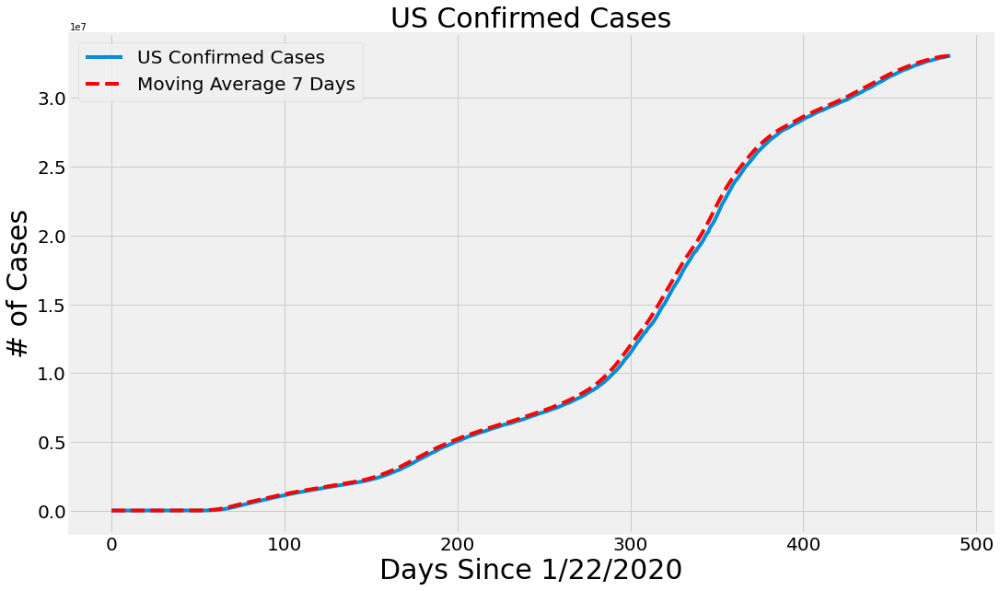

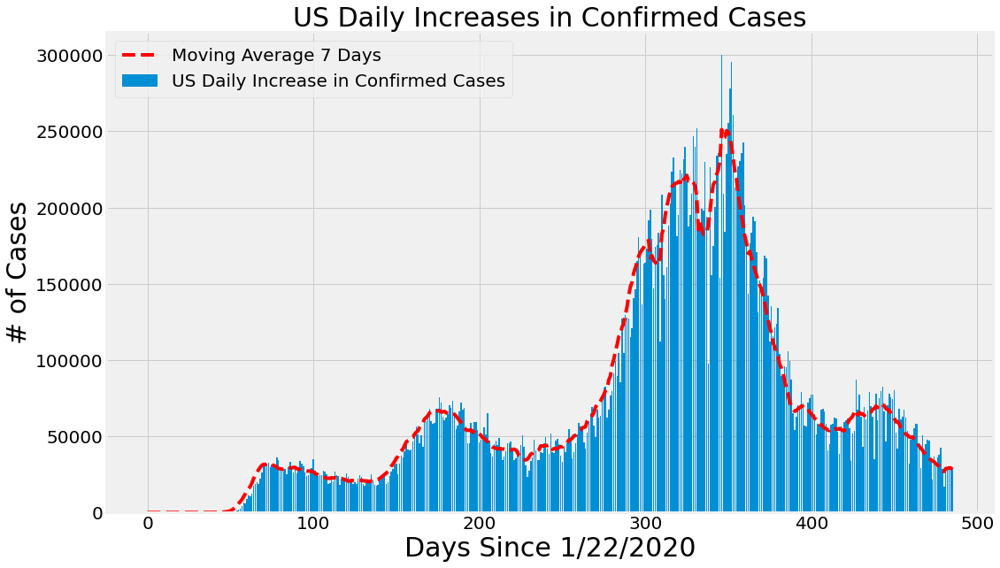

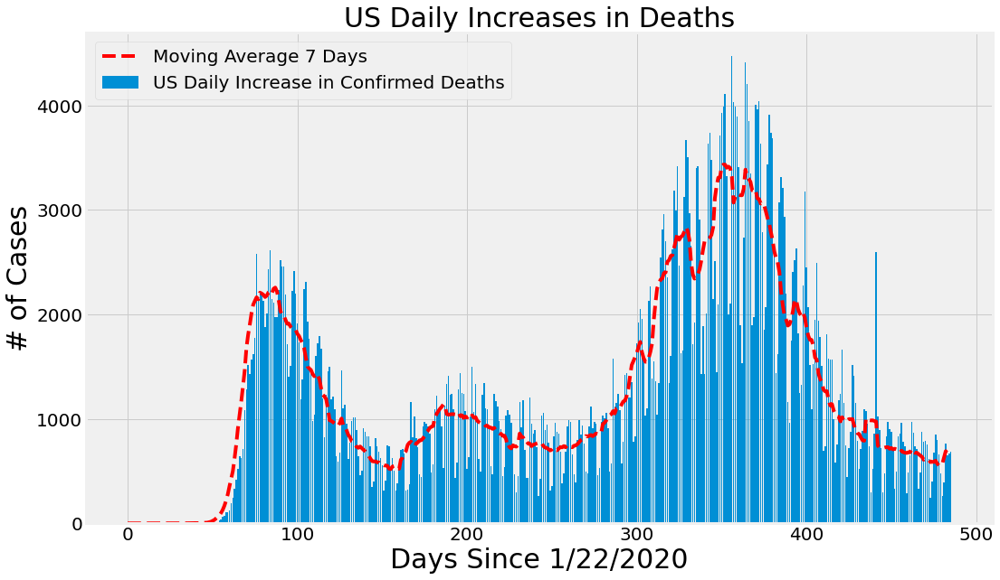

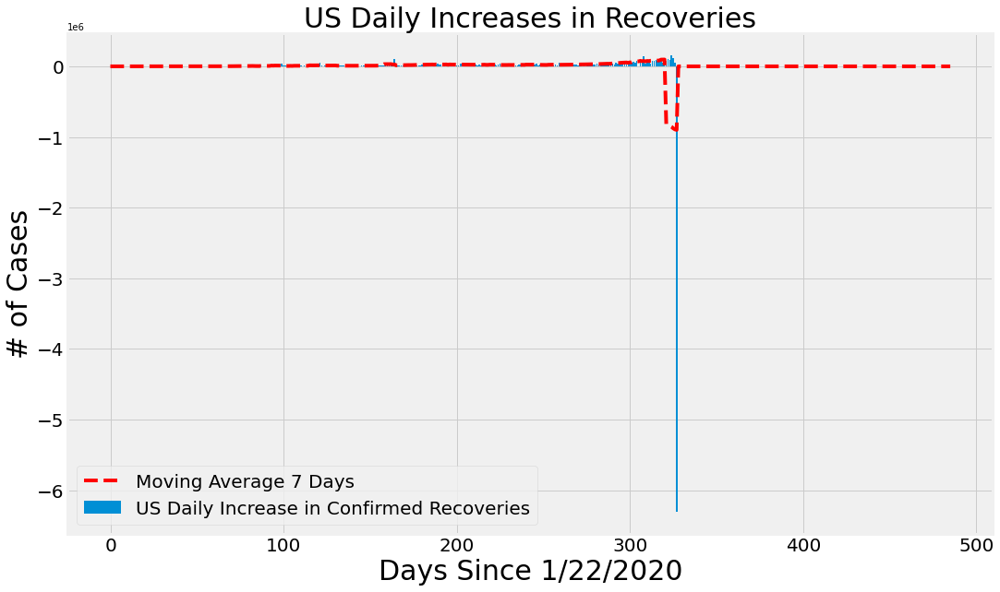

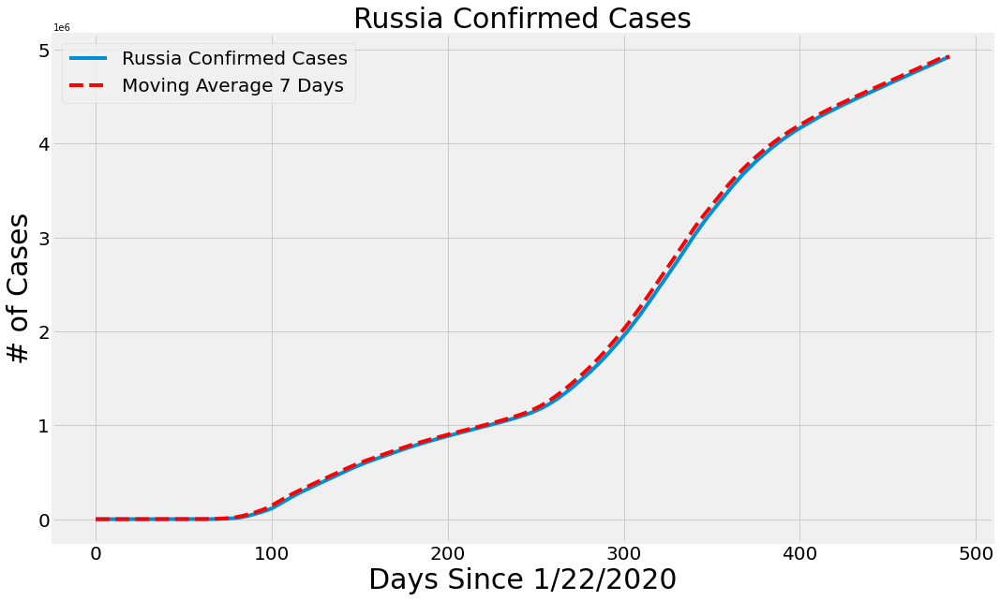

...

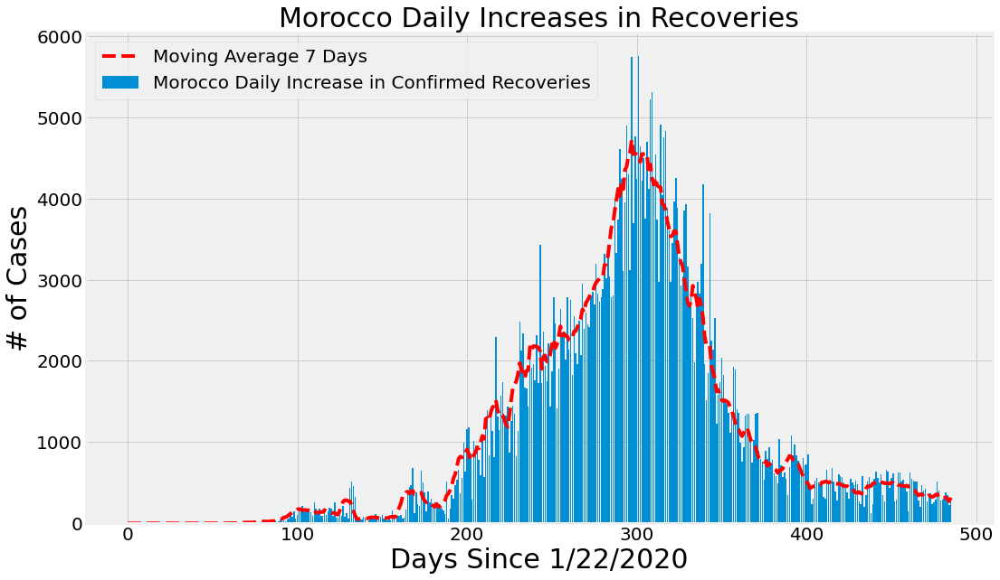

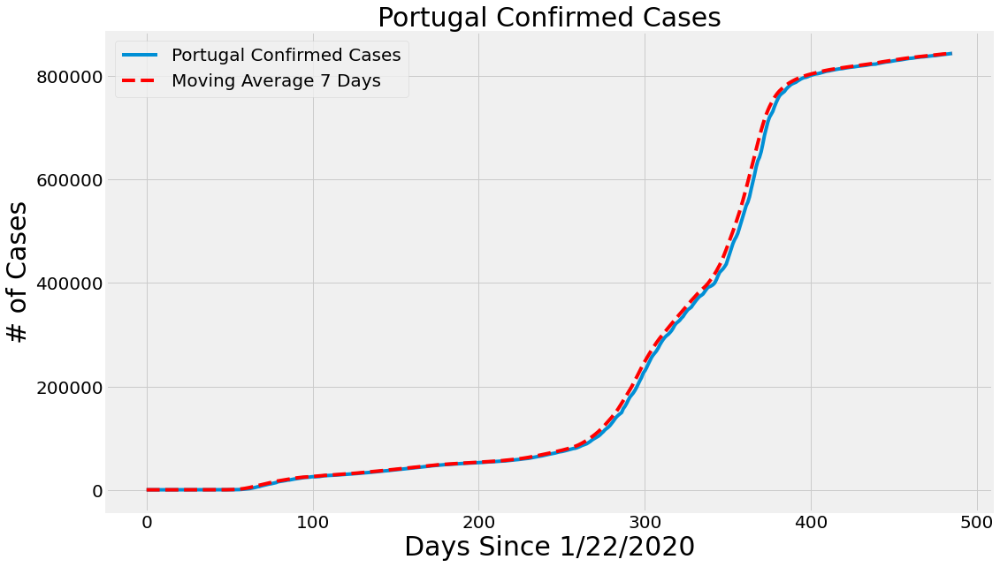

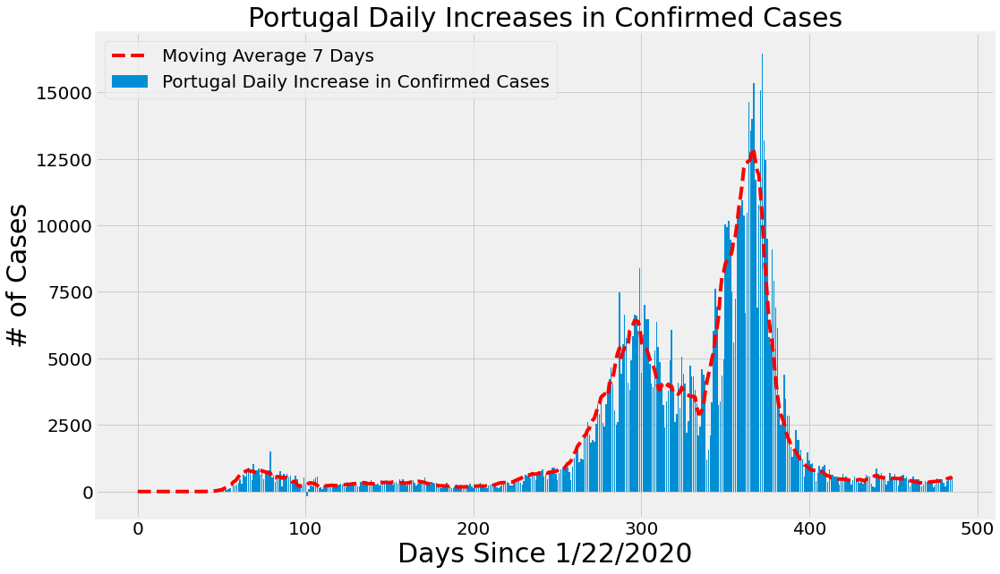

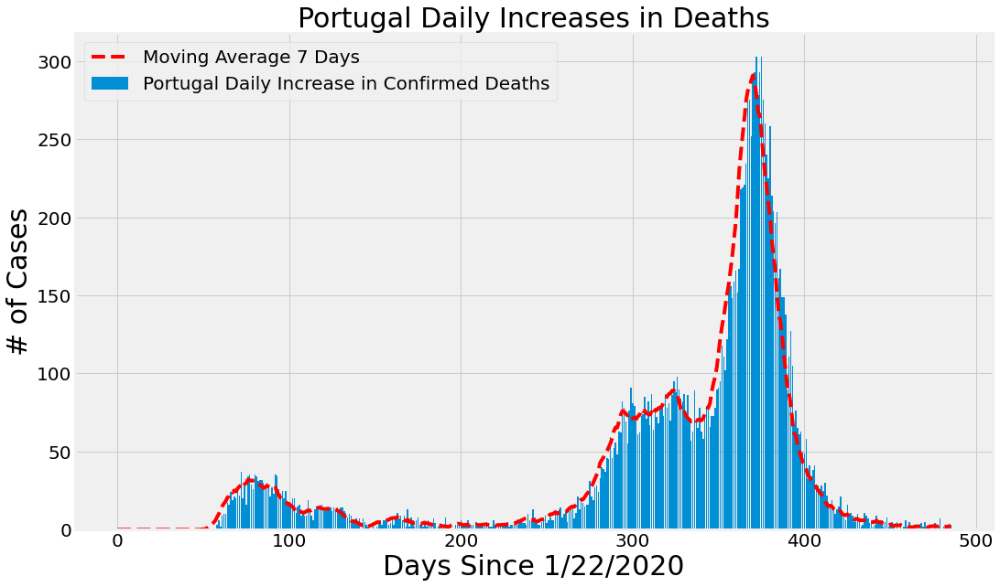

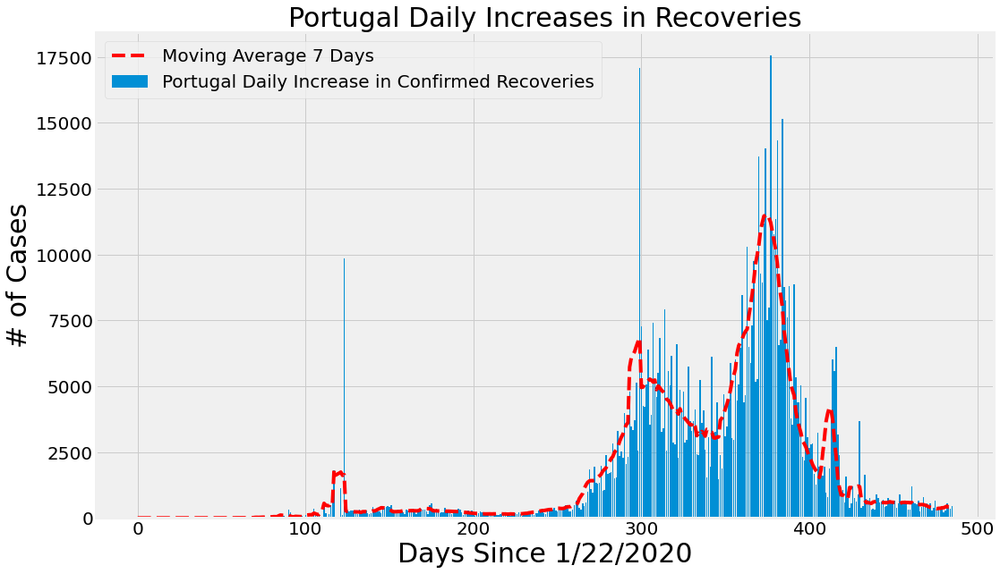

In [31]:
countries = ['US', 'Russia', 'India', 'Brazil', 'South Africa', 'China', 'Italy',
             'Germany', 'Spain', 'France', 'United Kingdom', 'Peru', 'Mexico', 'Colombia', 'Argentina', 'Saudi Arabia', 'Iran', 'Bangladesh',
            'Pakistan', 'Turkey', 'Philippines', 'Iraq', 'Indonesia', 'Israel', 'Ukraine', 'Ecuador', 'Bolivia', 'Netherlands', 'Belgium', 'Poland', 'Czechia', 'Switzerland',
            'Romania', 'Morocco','Portugal'] 

for country in countries:
    country_visualizations(country)

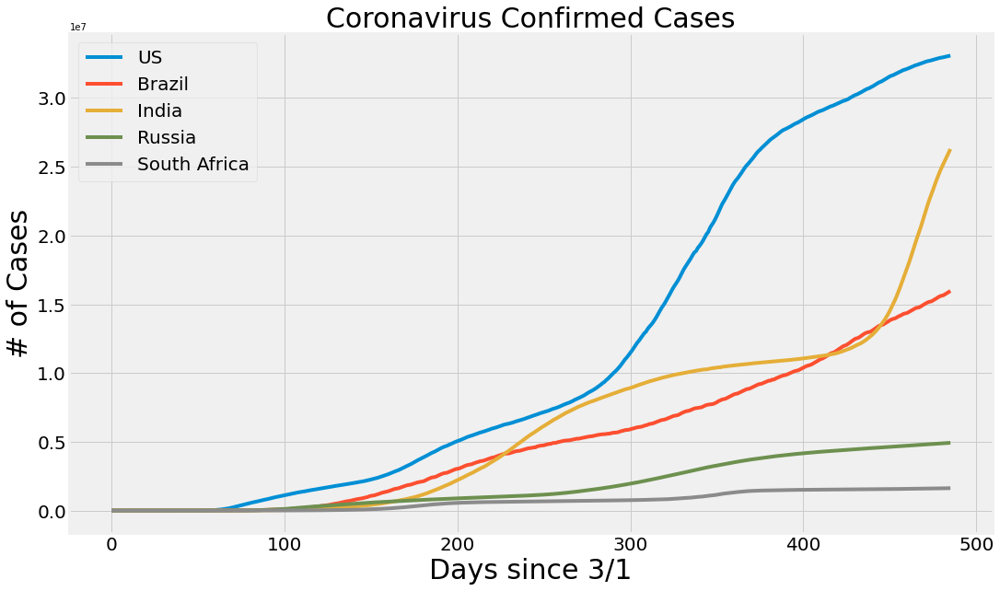

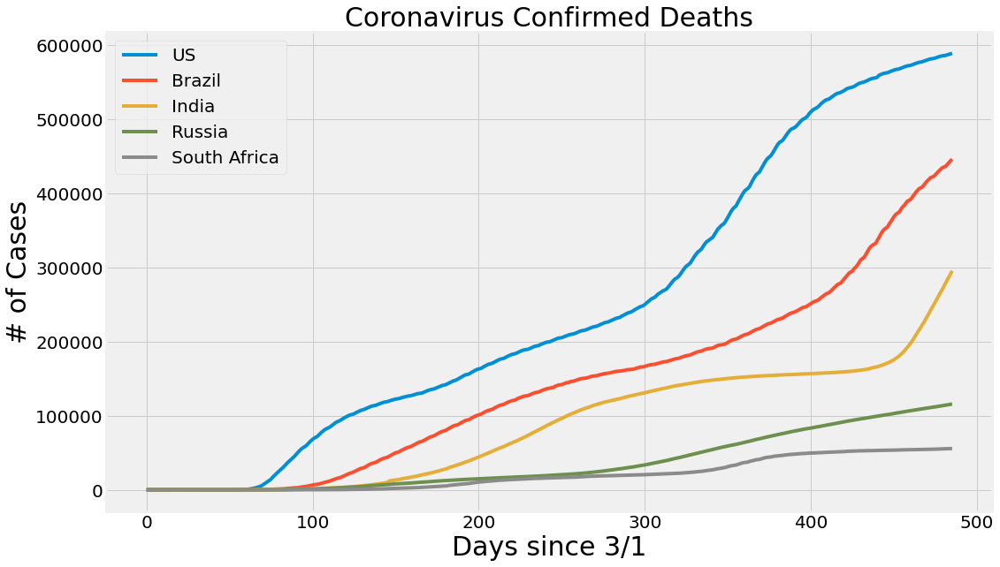

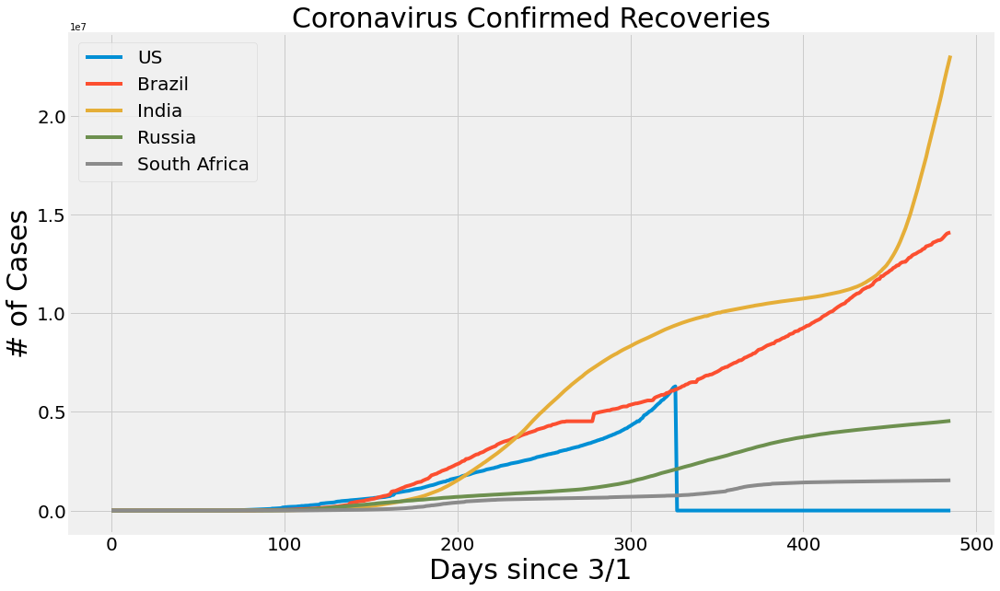

In [32]:
# Country Comparison
# removed redundant code

compare_countries = ['US', 'Brazil', 'India', 'Russia', 'South Africa'] 
graph_name = ['Coronavirus Confirmed Cases', 'Coronavirus Confirmed Deaths', 'Coronavirus Confirmed Recoveries']

for num in range(3):
    plt.figure(figsize=(16, 10))
    for country in compare_countries:
        plt.plot(get_country_info(country)[num])
    plt.legend(compare_countries, prop={'size': 20})
    plt.xlabel('Days since 3/1', size=30)
    plt.ylabel('# of Cases', size=30)
    plt.title(graph_name[num], size=30)
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()

In [33]:
def plot_predictions(x, y, pred, algo_name, color):
    plt.figure(figsize=(16, 10))
    plt.plot(x, y)
    plt.plot(future_forcast, pred, linestyle='dashed', color=color)
    plt.title('Worldwide Coronavirus Cases Over Time', size=30)
    plt.xlabel('Days Since 1/22/2020', size=30)
    plt.ylabel('# of Cases', size=30)
    plt.legend(['Confirmed Cases', algo_name], prop={'size': 20})
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()

# Predictions for confirmed coronavirus cases worldwide
<a id='prediction'></a>

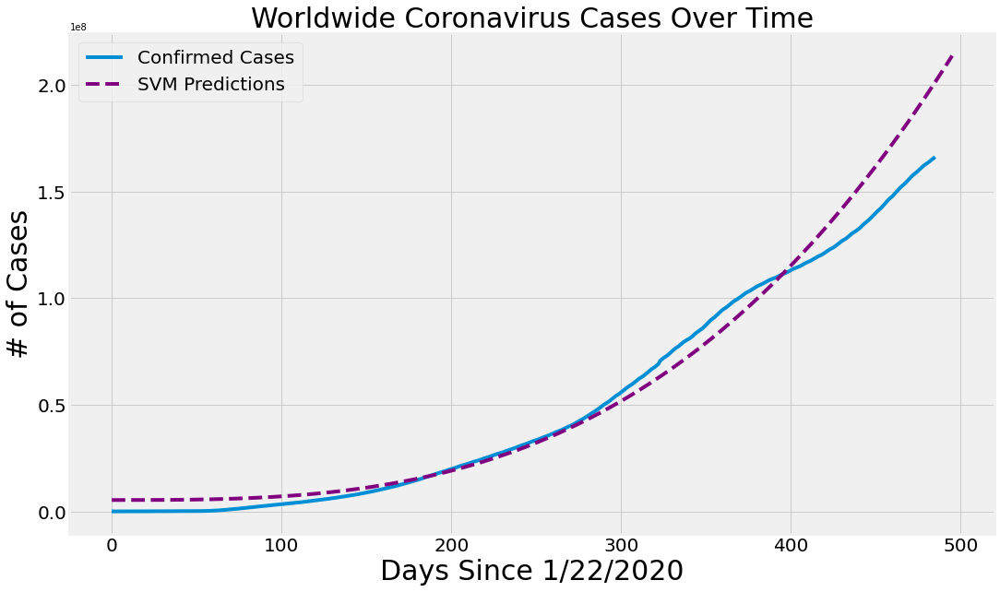

In [34]:
plot_predictions(adjusted_dates, world_cases, svm_pred, 'SVM Predictions', 'purple')

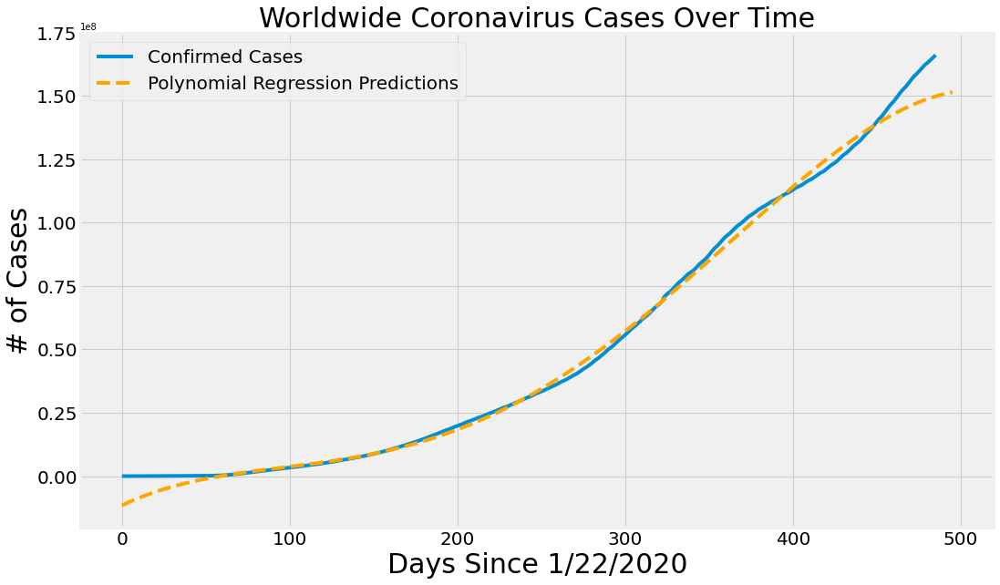

In [35]:
plot_predictions(adjusted_dates, world_cases, linear_pred, 'Polynomial Regression Predictions', 'orange')

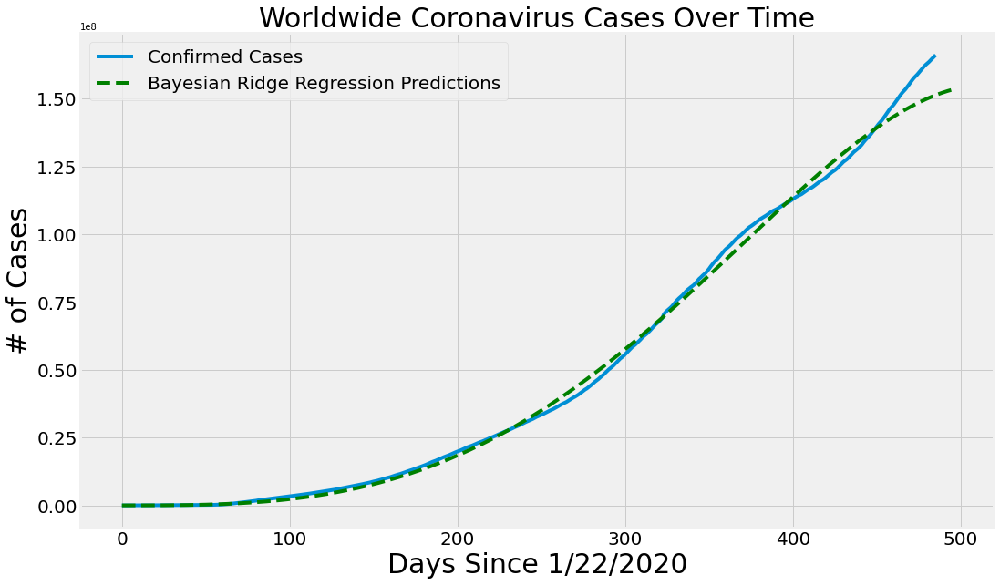

In [36]:
plot_predictions(adjusted_dates, world_cases, bayesian_pred, 'Bayesian Ridge Regression Predictions', 'green')

# Future Prediction

In [37]:
# Future predictions using SVM 
svm_df = pd.DataFrame({'Date': future_forcast_dates[-10:], 'SVM Predicted # of Confirmed Cases Worldwide': np.round(svm_pred[-10:])})
svm_df.style.background_gradient(cmap='Reds')

,Date,SVM Predicted # of Confirmed Cases Worldwide
0,05/22/2021,202446244.000000
1,05/23/2021,203665502.000000
2,05/24/2021,204889778.000000
3,05/25/2021,206119081.000000
4,05/26/2021,207353423.000000
5,05/27/2021,208592813.000000
6,05/28/2021,209837261.000000
7,05/29/2021,211086779.000000
8,05/30/2021,212341376.000000
9,05/31/2021,213601063.000000


In [38]:
# Future predictions using polynomial regression
linear_pred = linear_pred.reshape(1,-1)[0]
linear_df = pd.DataFrame({'Date': future_forcast_dates[-10:], 'Polynomial Predicted # of Confirmed Cases Worldwide': np.round(linear_pred[-10:])})
linear_df.style.background_gradient(cmap='Reds')

,Date,Polynomial Predicted # of Confirmed Cases Worldwide
0,05/22/2021,150068160.000000
1,05/23/2021,150255096.000000
2,05/24/2021,150434604.000000
3,05/25/2021,150606604.000000
4,05/26/2021,150771016.000000
5,05/27/2021,150927759.000000
6,05/28/2021,151076752.000000
7,05/29/2021,151217915.000000
8,05/30/2021,151351165.000000
9,05/31/2021,151476421.000000


In [39]:
# Future predictions using Bayesian Ridge 
bayesian_df = pd.DataFrame({'Date': future_forcast_dates[-10:], 'Bayesian Ridge Predicted # of Confirmed Cases Worldwide': np.round(bayesian_pred[-10:])})
bayesian_df.style.background_gradient(cmap='Reds')

,Date,Bayesian Ridge Predicted # of Confirmed Cases Worldwide
0,05/22/2021,151593960.000000
1,05/23/2021,151821603.000000
2,05/24/2021,152042141.000000
3,05/25/2021,152255488.000000
4,05/26/2021,152461557.000000
5,05/27/2021,152660259.000000
6,05/28/2021,152851508.000000
7,05/29/2021,153035214.000000
8,05/30/2021,153211289.000000
9,05/31/2021,153379642.000000


Mortality Rate (worldwide) **susceptible to change **

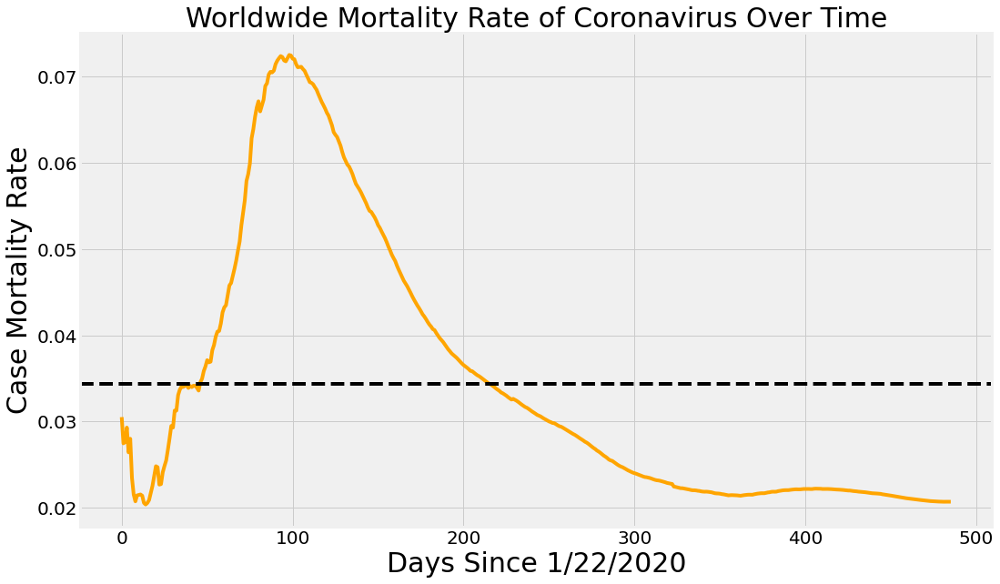

In [40]:
mean_mortality_rate = np.mean(mortality_rate)
plt.figure(figsize=(16, 10))
plt.plot(adjusted_dates, mortality_rate, color='orange')
plt.axhline(y = mean_mortality_rate,linestyle='--', color='black')
plt.title('Worldwide Mortality Rate of Coronavirus Over Time', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('Case Mortality Rate', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

Recovery Rate (worldwide) **suceptible to change **

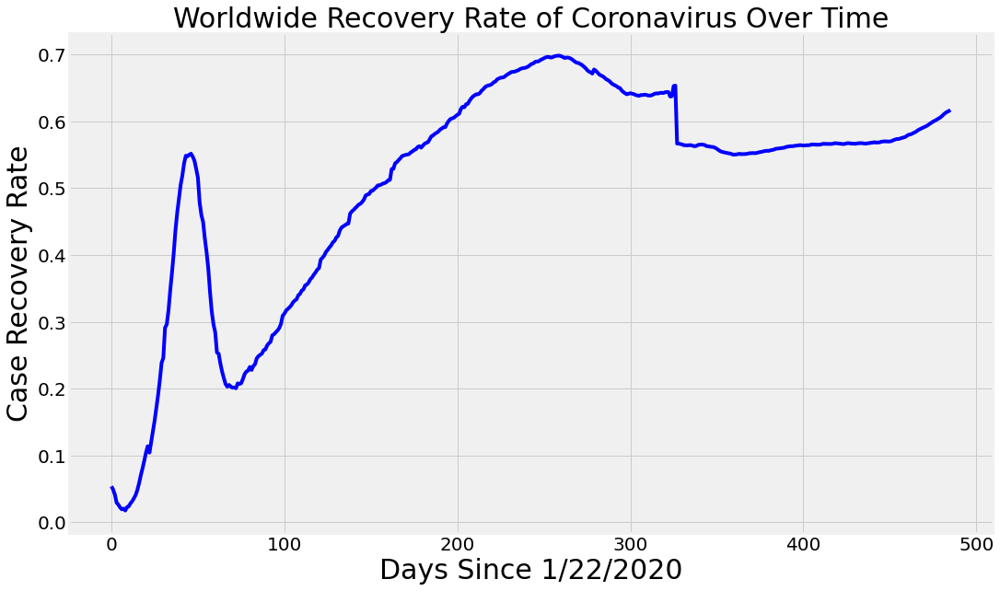

In [41]:
mean_recovery_rate = np.mean(recovery_rate)
plt.figure(figsize=(16, 10))
plt.plot(adjusted_dates, recovery_rate, color='blue')
plt.title('Worldwide Recovery Rate of Coronavirus Over Time', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('Case Recovery Rate', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

Graphing deaths against recoveries

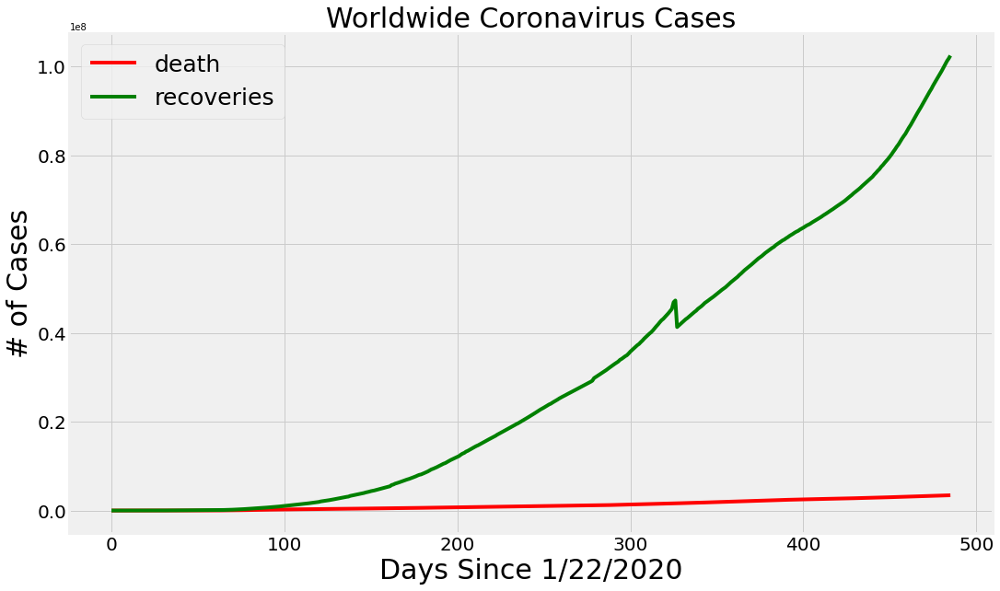

In [42]:
plt.figure(figsize=(16, 10))
plt.plot(adjusted_dates, total_deaths, color='r')
plt.plot(adjusted_dates, total_recovered, color='green')
plt.legend(['death', 'recoveries'], loc='best', fontsize=25)
plt.title('Worldwide Coronavirus Cases', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

Plotting the number of deaths against the number of recoveries

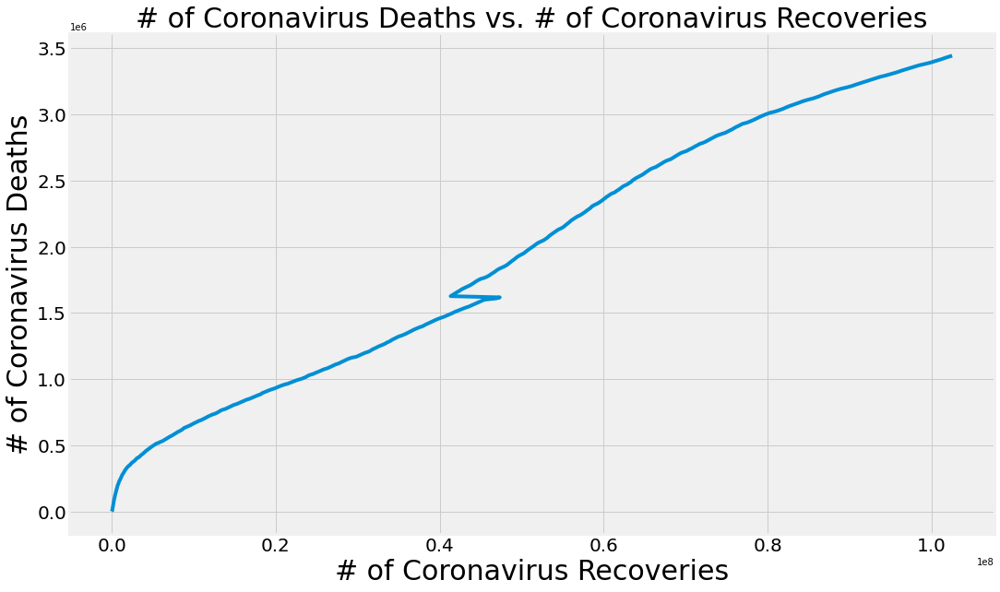

In [43]:
plt.figure(figsize=(16, 10))
plt.plot(total_recovered, total_deaths)
plt.title('# of Coronavirus Deaths vs. # of Coronavirus Recoveries', size=30)
plt.xlabel('# of Coronavirus Recoveries', size=30)
plt.ylabel('# of Coronavirus Deaths', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

Getting information about **countries/regions** that have confirmed coronavirus cases

In [44]:
latest_data

,FIPS,Admin2,Province_State,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,Combined_Key,Incident_Rate,Case_Fatality_Ratio
0,NaN,NaN,NaN,Afghanistan,2020-11-27 05:26:53,33.939110,67.709953,45600,1737,36232,7747.0,Afghanistan,117.436291,3.799545
1,NaN,NaN,NaN,Albania,2020-11-27 05:26:53,41.153300,20.168300,35600,753,17352,17495.0,Albania,1237.056085,2.115169
2,NaN,NaN,NaN,Algeria,2020-11-27 05:26:53,28.033900,1.659600,79110,2352,51334,25424.0,Algeria,180.406199,2.973075
3,NaN,NaN,NaN,Andorra,2020-11-27 05:26:53,42.506300,1.521800,6534,76,5649,809.0,Andorra,8456.610367,1.163147
4,NaN,NaN,NaN,Angola,2020-11-27 05:26:53,-11.202700,17.873900,14920,341,7617,6962.0,Angola,45.396088,2.285523
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3975,NaN,NaN,NaN,Zambia,2020-11-27 05:26:53,-13.133897,27.849332,17553,357,16779,417.0,Zambia,95.479994,2.033840
3976,NaN,NaN,NaN,Zimbabwe,2020-11-27 05:26:53,-19.015438,29.154857,9623,274,8397,952.0,Zimbabwe,64.744986,2.847345
3977,2066.0,Copper River,Alaska,US,2021-04-02 15:13:53,60.388600,-162.890520,111,0,0,0.0,"Copper River, Alaska, US",NaN,NaN
3978,2063.0,Chugach,Alaska,US,2021-04-02 15:13:53,61.166660,-149.900000,159,3,0,0.0,"Chugach, Alaska, US",NaN,NaN


In [45]:
unique_countries =  list(latest_data['Country_Region'].unique())

In [46]:
country_confirmed_cases = []
country_death_cases = [] 
country_active_cases = []
country_recovery_cases = []
country_incidence_rate = [] 
country_mortality_rate = [] 

no_cases = []
for i in unique_countries:
    cases = latest_data[latest_data['Country_Region']==i]['Confirmed'].sum()
    if cases > 0:
        country_confirmed_cases.append(cases)
    else:
        no_cases.append(i)
        
for i in no_cases:
    unique_countries.remove(i)
    
# sort countries by the number of confirmed cases
unique_countries = [k for k, v in sorted(zip(unique_countries, country_confirmed_cases), key=operator.itemgetter(1), reverse=True)]
for i in range(len(unique_countries)):
    country_confirmed_cases[i] = latest_data[latest_data['Country_Region']==unique_countries[i]]['Confirmed'].sum()
    country_death_cases.append(latest_data[latest_data['Country_Region']==unique_countries[i]]['Deaths'].sum())
    country_recovery_cases.append(latest_data[latest_data['Country_Region']==unique_countries[i]]['Recovered'].sum())
    country_active_cases.append(latest_data[latest_data['Country_Region']==unique_countries[i]]['Active'].sum())
    country_incidence_rate.append(latest_data[latest_data['Country_Region']==unique_countries[i]]['Incident_Rate'].sum())
    country_mortality_rate.append(country_death_cases[i]/country_confirmed_cases[i])

# Data table
<a id='data_table'></a>

In [47]:
country_df = pd.DataFrame({'Country Name': unique_countries, 'Number of Confirmed Cases': country_confirmed_cases,
                          'Number of Deaths': country_death_cases, 'Number of Recoveries' : country_recovery_cases, 
                          'Number of Active Cases' : country_active_cases, 'Incidence Rate' : country_incidence_rate,
                          'Mortality Rate': country_mortality_rate})
# number of cases per country/region

country_df.style.background_gradient(cmap='Oranges')

,Country Name,Number of Confirmed Cases,Number of Deaths,Number of Recoveries,Number of Active Cases,Incidence Rate,Mortality Rate
0,US,13005807,265728,4871203,7748607.000000,13865815.205065,0.020431
1,India,9309787,135715,8718517,455555.000000,34146.575576,0.014578
2,Brazil,6204220,171460,5556887,475873.000000,105647.110925,0.027636
3,France,2237506,51041,163814,2020682.000000,21674.546029,0.022812
4,Russia,2169424,37688,1671349,460387.000000,130225.821850,0.017372
5,Spain,1617355,44374,150376,1422605.000000,67778.661886,0.027436
6,United Kingdom,1578432,57128,3457,1517847.000000,16998.323926,0.036193
7,Italy,1509875,52850,661180,795845.000000,50820.091458,0.035003
8,Argentina,1399431,37941,1226662,134828.000000,3096.375575,0.027112
9,Colombia,1280487,36019,1181753,62715.000000,73649.389180,0.028129


In [48]:
unique_provinces =  list(latest_data['Province_State'].unique())

Getting the latest information about **provinces/states** that have confirmed coronavirus cases

In [49]:
province_confirmed_cases = []
province_country = [] 
province_death_cases = [] 
# province_recovery_cases = []
province_active = [] 
province_incidence_rate = []
province_mortality_rate = [] 

no_cases = [] 
for i in unique_provinces:
    cases = latest_data[latest_data['Province_State']==i]['Confirmed'].sum()
    if cases > 0:
        province_confirmed_cases.append(cases)
    else:
        no_cases.append(i)
 
# remove areas with no confirmed cases
for i in no_cases:
    unique_provinces.remove(i)
    
unique_provinces = [k for k, v in sorted(zip(unique_provinces, province_confirmed_cases), key=operator.itemgetter(1), reverse=True)]
for i in range(len(unique_provinces)):
    province_confirmed_cases[i] = latest_data[latest_data['Province_State']==unique_provinces[i]]['Confirmed'].sum()
    province_country.append(latest_data[latest_data['Province_State']==unique_provinces[i]]['Country_Region'].unique()[0])
    province_death_cases.append(latest_data[latest_data['Province_State']==unique_provinces[i]]['Deaths'].sum())
#     province_recovery_cases.append(latest_data[latest_data['Province_State']==unique_provinces[i]]['Recovered'].sum())
    province_active.append(latest_data[latest_data['Province_State']==unique_provinces[i]]['Active'].sum())
    province_incidence_rate.append(latest_data[latest_data['Province_State']==unique_provinces[i]]['Incident_Rate'].sum())
    province_mortality_rate.append(province_death_cases[i]/province_confirmed_cases[i])

In [50]:
# nan_indices = [] 

# # handle nan if there is any, it is usually a float: float('nan')

# for i in range(len(unique_provinces)):
#     if type(unique_provinces[i]) == float:
#         nan_indices.append(i)

# unique_provinces = list(unique_provinces)
# province_confirmed_cases = list(province_confirmed_cases)

# for i in nan_indices:
#     unique_provinces.pop(i)
#     province_confirmed_cases.pop(i)

In [51]:
# number of cases per province/state/city top 100 
province_limit =100 
province_df = pd.DataFrame({'Province/State Name': unique_provinces[:province_limit], 'Country': province_country[:province_limit], 'Number of Confirmed Cases': province_confirmed_cases[:province_limit],
                          'Number of Deaths': province_death_cases[:province_limit],'Number of Active Cases' : province_active[:province_limit], 
                            'Incidence Rate' : province_incidence_rate[:province_limit], 'Mortality Rate': province_mortality_rate[:province_limit]})
# number of cases per country/region

province_df.style.background_gradient(cmap='Oranges')

,Province/State Name,Country,Number of Confirmed Cases,Number of Deaths,Number of Active Cases,Incidence Rate,Mortality Rate
0,Maharashtra,India,1802365,46813,87014.000000,1463.621237,0.025973
1,England,United Kingdom,1355272,49956,1305316.000000,2421.114311,0.036860
2,Texas,US,1256127,21965,1181165.000000,962046.830067,0.017486
3,Sao Paulo,Brazil,1229267,41773,102834.000000,2677.030615,0.033982
4,California,US,1181614,19122,1152777.000000,149905.347669,0.016183
5,Florida,US,961676,18254,943422.000000,325241.274606,0.018981
6,Karnataka,India,879560,11726,25335.000000,1301.842855,0.013332
7,Andhra Pradesh,India,865705,6970,12615.000000,1606.030626,0.008051
8,Tamil Nadu,India,776174,11669,11173.000000,997.124058,0.015034
9,Illinois,US,697489,12596,684895.000000,549054.151169,0.018059


In [52]:
# return the data table with province/state info for a given country
def country_table(country_name):
    states = list(latest_data[latest_data['Country_Region']==country_name]['Province_State'].unique())
    state_confirmed_cases = []
    state_death_cases = [] 
    # state_recovery_cases = []
    state_active = [] 
    state_incidence_rate = [] 
    state_mortality_rate = [] 

    no_cases = [] 
    for i in states:
        cases = latest_data[latest_data['Province_State']==i]['Confirmed'].sum()
        if cases > 0:
            state_confirmed_cases.append(cases)
        else:
            no_cases.append(i)

    # remove areas with no confirmed cases
    for i in no_cases:
        states.remove(i)

    states = [k for k, v in sorted(zip(states, state_confirmed_cases), key=operator.itemgetter(1), reverse=True)]
    for i in range(len(states)):
        state_confirmed_cases[i] = latest_data[latest_data['Province_State']==states[i]]['Confirmed'].sum()
        state_death_cases.append(latest_data[latest_data['Province_State']==states[i]]['Deaths'].sum())
    #     state_recovery_cases.append(latest_data[latest_data['Province_State']==states[i]]['Recovered'].sum())
        state_active.append(latest_data[latest_data['Province_State']==states[i]]['Active'].sum())
        state_incidence_rate.append(latest_data[latest_data['Province_State']==states[i]]['Incident_Rate'].sum())
        state_mortality_rate.append(state_death_cases[i]/state_confirmed_cases[i])
        
      
    state_df = pd.DataFrame({'State Name': states, 'Number of Confirmed Cases': state_confirmed_cases,
                              'Number of Deaths': state_death_cases, 'Number of Active Cases' : state_active, 
                             'Incidence Rate' : state_incidence_rate, 'Mortality Rate': state_mortality_rate})
    # number of cases per country/region
    return state_df

Data table for the **United States**

In [53]:
us_table = country_table('US')
us_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Number of Active Cases,Incidence Rate,Mortality Rate
0,Texas,1256127,21965,1181165.000000,962046.830067,0.017486
1,California,1181614,19122,1152777.000000,149905.347669,0.016183
2,Florida,961676,18254,943422.000000,325241.274606,0.018981
3,Illinois,697489,12596,684895.000000,549054.151169,0.018059
4,New York,628024,34451,585756.000000,116412.047237,0.054856
5,Georgia,461517,9336,452181.000000,733692.136731,0.020229
6,Wisconsin,398104,3415,394689.000000,481357.200131,0.008578
7,Ohio,382743,7457,376469.000000,280014.492969,0.019483
8,Michigan,352433,9170,343263.000000,250994.281016,0.026019
9,Tennessee,352376,4519,347857.000000,531738.110632,0.012824


Data table for **Brazil**

In [54]:
brazil_table = country_table('Brazil')
brazil_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Number of Active Cases,Incidence Rate,Mortality Rate
0,Sao Paulo,1229267,41773,102834.000000,2677.030615,0.033982
1,Minas Gerais,406880,9904,23650.000000,1922.074813,0.024341
2,Bahia,392381,8185,8738.000000,2638.198827,0.020860
3,Rio de Janeiro,346024,22394,6432.000000,2004.200072,0.064718
4,Santa Catarina,343007,3608,26890.000000,4787.399153,0.010519
5,Rio Grande do Sul,308647,6686,16969.000000,2712.846236,0.021662
6,Ceara,297152,9545,38922.000000,3253.936289,0.032122
7,Goias,276943,6305,3730.000000,3945.982206,0.022766
8,Parana,269258,6043,69954.000000,2354.897784,0.022443
9,Para,268524,6884,10191.000000,3121.332254,0.025636


Data table for **India**

In [55]:
india_table = country_table('India')
india_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Number of Active Cases,Incidence Rate,Mortality Rate
0,Maharashtra,1802365,46813,87014.000000,1463.621237,0.025973
1,Karnataka,879560,11726,25335.000000,1301.842855,0.013332
2,Andhra Pradesh,865705,6970,12615.000000,1606.030626,0.008051
3,Tamil Nadu,776174,11669,11173.000000,997.124058,0.015034
4,Kerala,583741,2148,64615.000000,1635.154364,0.003680
5,Delhi,551262,8811,38734.000000,2946.204361,0.015983
6,Uttar Pradesh,535449,7674,25422.000000,225.089485,0.014332
7,West Bengal,470498,8224,24670.000000,472.343432,0.017479
8,Odisha,316645,1704,6102.000000,683.067388,0.005381
9,Telangana,267665,1448,10839.000000,679.995992,0.005410


Data table for **Russia**

In [56]:
russia_table = country_table('Russia')
russia_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Number of Active Cases,Incidence Rate,Mortality Rate
0,Moscow,577177,8603,140156.000000,4615.028000,0.014905
1,Saint Petersburg,111133,5217,42169.000000,2076.501303,0.046944
2,Moscow Oblast,106770,1987,27418.000000,1422.957772,0.018610
3,Nizhny Novgorod Oblast,52633,1112,4787.000000,1627.110826,0.021127
4,Sverdlovsk Oblast,44775,988,6812.000000,1035.198841,0.022066
5,Rostov Oblast,38706,1252,6095.000000,917.105561,0.032346
6,Krasnoyarsk Krai,34894,1025,6539.000000,1213.072706,0.029375
7,Khanty-Mansi Autonomous Okrug,33474,389,4705.000000,2184.640426,0.011621
8,Voronezh Oblast,33117,548,1313.000000,1419.035654,0.016547
9,Irkutsk Oblast,30986,736,2725.000000,1288.830565,0.023753


Data table for **China**

In [57]:
china_table = country_table('China')
china_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Number of Active Cases,Incidence Rate,Mortality Rate
0,Hubei,68148,4512,7.000000,115.173230,0.066209
1,Unknown,22597,16247,-1684303.000000,0.000000,0.718989
2,Hong Kong,5947,108,539.000000,79.325190,0.018160
3,Guangdong,1988,8,37.000000,1.752159,0.004024
4,Shanghai,1322,7,62.000000,5.453795,0.005295
5,Zhejiang,1293,1,9.000000,2.253791,0.000773
6,Henan,1289,22,6.000000,1.342009,0.017067
7,Hunan,1020,4,0.000000,1.478475,0.003922
8,Anhui,992,6,1.000000,1.568627,0.006048
9,Xinjiang,980,3,0.000000,3.940491,0.003061


Data table for **United Kingdom**

In [58]:
uk_table = country_table('United Kingdom')
uk_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Number of Active Cases,Incidence Rate,Mortality Rate
0,England,1355272,49956,1305316.000000,2421.114311,0.036860
1,Scotland,92186,3639,88547.000000,1687.368440,0.039475
2,Wales,75986,2474,73512.000000,2421.015740,0.032559
3,Northern Ireland,51118,962,50156.000000,2716.730442,0.018819
4,Unknown,22597,16247,-1684303.000000,0.000000,0.718989
5,Channel Islands,1147,48,139.000000,672.731218,0.041848
6,Gibraltar,991,5,83.000000,2941.438366,0.005045
7,Turks and Caicos Islands,746,6,40.000000,1926.752415,0.008043
8,Isle of Man,369,25,6.000000,433.954276,0.067751
9,Cayman Islands,269,2,18.000000,409.312234,0.007435


Data table for **France**

In [59]:
france_table = country_table('France')
france_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Number of Active Cases,Incidence Rate,Mortality Rate
0,French Polynesia,13883,72,8969.000000,4942.257853,0.005186
1,French Guiana,11138,70,1073.000000,3729.049625,0.006285
2,Guadeloupe,8344,149,5953.000000,2085.337905,0.017857
3,Reunion,7836,39,1137.000000,875.229530,0.004977
4,Martinique,5413,40,5275.000000,1442.447337,0.007390
5,Mayotte,5181,49,2168.000000,1899.103049,0.009458
6,St Martin,690,12,80.000000,1784.836649,0.017391
7,Saint Barthelemy,127,0,33.000000,1284.774911,0.000000
8,New Caledonia,32,0,0.000000,11.208760,0.000000
9,Saint Pierre and Miquelon,16,0,4.000000,276.100086,0.000000


Data table for **Italy**

In [60]:
italy_table = country_table('Italy')
italy_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Number of Active Cases,Incidence Rate,Mortality Rate
0,Lombardia,392655,21212,140401.000000,3902.908522,0.054022
1,Piemonte,159004,5875,78406.000000,3649.889381,0.036949
2,Campania,146018,1483,103384.000000,2516.817508,0.010156
3,Veneto,134056,3501,75152.000000,2732.572147,0.026116
4,Emilia-Romagna,114855,5548,71472.000000,2575.526233,0.048304
5,Lazio,111852,2215,87303.000000,1902.541927,0.019803
6,Toscana,99327,2450,48135.000000,2663.178574,0.024666
7,Sicilia,58769,1371,38508.000000,1175.405624,0.023329
8,Liguria,49951,2322,13492.000000,3221.315070,0.046486
9,Puglia,49001,1354,34979.000000,1216.191497,0.027632


Data table for **Spain**

In [61]:
spain_table = country_table('Spain')
spain_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Number of Active Cases,Incidence Rate,Mortality Rate
0,Madrid,345469,11349,293384.000000,5201.554614,0.032851
1,Catalonia,300125,7850,266072.000000,3966.533231,0.026156
2,Andalusia,226989,3842,212476.000000,2693.462578,0.016926
3,Castilla y Leon,119178,4463,105999.000000,4949.801328,0.037448
4,C. Valenciana,99403,2288,87145.000000,1998.062701,0.023017
5,Pais Vasco,95296,2452,76684.000000,4375.631348,0.025730
6,Castilla - La Mancha,84140,3738,74010.000000,4134.893657,0.044426
7,Aragon,72243,2251,66220.000000,5470.525963,0.031159
8,Murcia,53429,589,50660.000000,3591.471993,0.011024
9,Galicia,48747,1178,38365.000000,1805.149603,0.024166


Data table for **Germany**

In [62]:
germany_table = country_table('Germany')
germany_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Number of Active Cases,Incidence Rate,Mortality Rate
0,Nordrhein-Westfalen,250884,3306,74473.000000,1399.034644,0.013177
1,Bayern,197988,3699,57714.000000,1514.049279,0.018683
2,Baden-Wurttemberg,142878,2626,43932.000000,1290.731958,0.018379
3,Hessen,83251,1199,28883.000000,1328.655246,0.014402
4,Niedersachsen,68217,1104,15854.000000,854.587465,0.016184
5,Berlin,61664,527,20609.000000,1691.822874,0.008546
6,Sachsen,49855,800,17785.000000,1222.554444,0.016047
7,Rheinland-Pfalz,41682,491,16465.000000,1020.406165,0.011780
8,Hamburg,24054,358,8596.000000,1306.445490,0.014883
9,Unknown,22597,16247,-1684303.000000,0.000000,0.718989


Data table for **the Netherlands**

In [63]:
netherlands_table = country_table('Netherlands')
netherlands_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Number of Active Cases,Incidence Rate,Mortality Rate
0,Zuid-Holland,142820,2263,140557.000000,3850.949229,0.015845
1,Noord-Holland,91183,1272,89911.000000,3166.596458,0.013950
2,Noord-Brabant,79639,2011,77628.000000,3107.311677,0.025251
3,Gelderland,49839,1042,48797.000000,2389.268785,0.020907
4,Limburg,47597,866,46731.000000,4852.196237,0.018194
5,Utrecht,42501,660,41841.000000,3136.989476,0.015529
6,Overijssel,29986,523,29463.000000,2579.649451,0.017441
7,Unknown,22597,16247,-1684303.000000,0.000000,0.718989
8,Flevoland,10505,133,10372.000000,2483.328251,0.012661
9,Friesland,8275,129,8146.000000,1273.161148,0.015589


<a id='bar_charts'></a>
# Bar Chart Visualizations for COVID-19

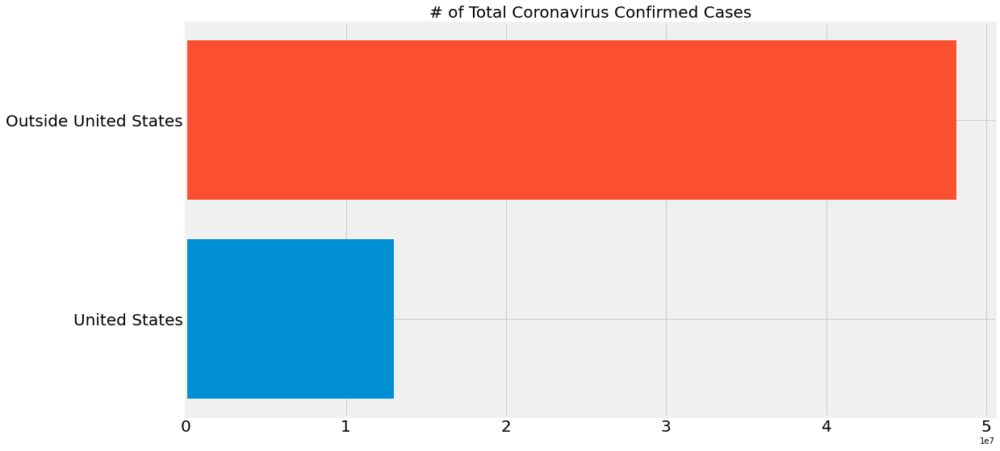

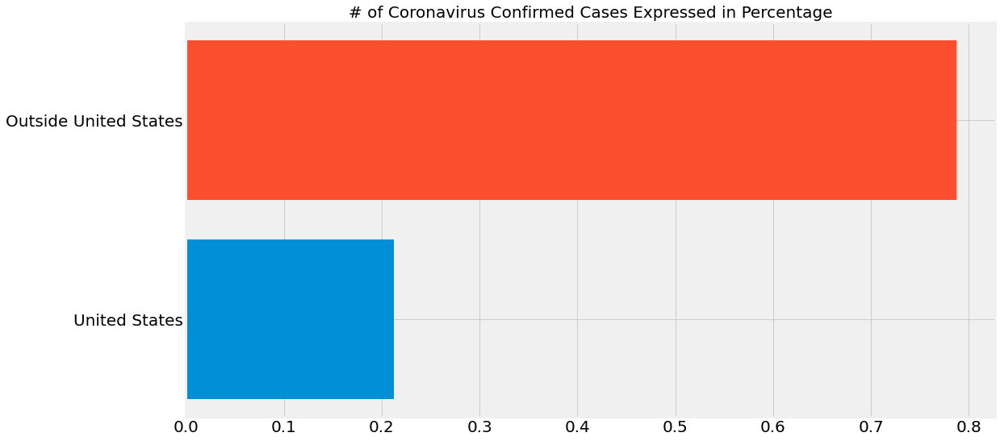

In [64]:
total_world_cases = np.sum(country_confirmed_cases)
us_confirmed = latest_data[latest_data['Country_Region']=='US']['Confirmed'].sum()
outside_us_confirmed = total_world_cases - us_confirmed

plt.figure(figsize=(16, 9))
plt.barh('United States', us_confirmed)
plt.barh('Outside United States', outside_us_confirmed)
plt.title('# of Total Coronavirus Confirmed Cases', size=20)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()


plt.figure(figsize=(16, 9))
plt.barh('United States', us_confirmed/total_world_cases)
plt.barh('Outside United States', outside_us_confirmed/total_world_cases)
plt.title('# of Coronavirus Confirmed Cases Expressed in Percentage', size=20)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

In [65]:
print('Outside United States {} cases ({}%):'.format(outside_us_confirmed, np.round((outside_us_confirmed/total_world_cases)*100, 1)))
print('United States {} cases ({}%)'.format(us_confirmed, np.round((us_confirmed/total_world_cases)*100, 1)))
print('Total: {} cases'.format(total_world_cases))

Outside United States 48134515 cases (78.7%):
United States 13005807 cases (21.3%)
Total: 61140322 cases


In [66]:
# Only show 15 countries with the most confirmed cases, the rest are grouped into the other category
visual_unique_countries = [] 
visual_confirmed_cases = []
others = np.sum(country_confirmed_cases[10:])

for i in range(len(country_confirmed_cases[:10])):
    visual_unique_countries.append(unique_countries[i])
    visual_confirmed_cases.append(country_confirmed_cases[i])
    
visual_unique_countries.append('Others')
visual_confirmed_cases.append(others)

***Visual Representations*** (bar charts and pie charts)

In [67]:
def plot_bar_graphs(x, y, title):
    plt.figure(figsize=(16, 12))
    plt.barh(x, y)
    plt.title(title, size=20)
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()
    
# good for a lot x values 
def plot_bar_graphs_tall(x, y, title):
    plt.figure(figsize=(19, 18))
    plt.barh(x, y)
    plt.title(title, size=25)
    plt.xticks(size=25)
    plt.yticks(size=25)
    plt.show()

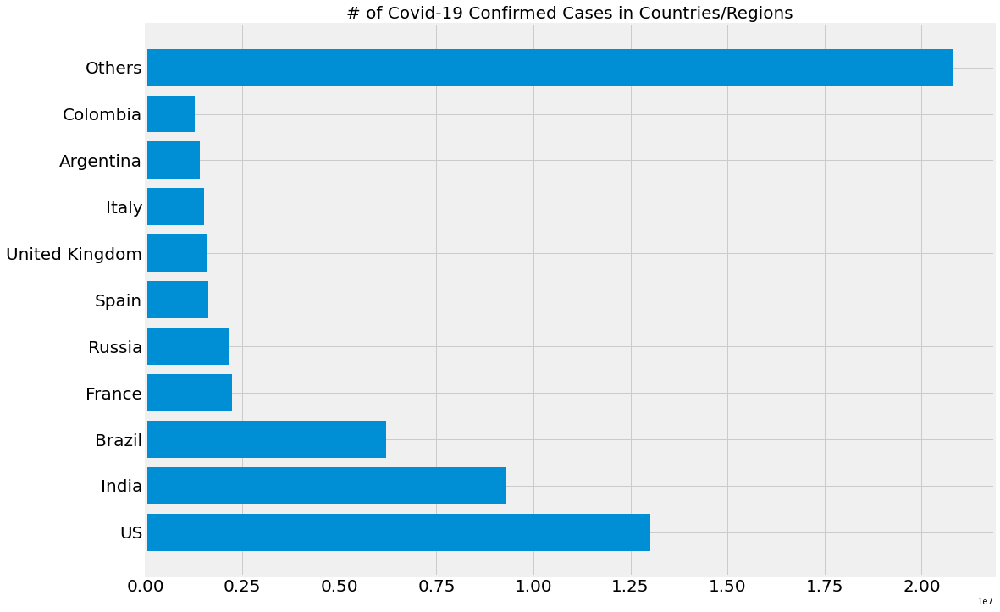

In [68]:
plot_bar_graphs(visual_unique_countries, visual_confirmed_cases, '# of Covid-19 Confirmed Cases in Countries/Regions')

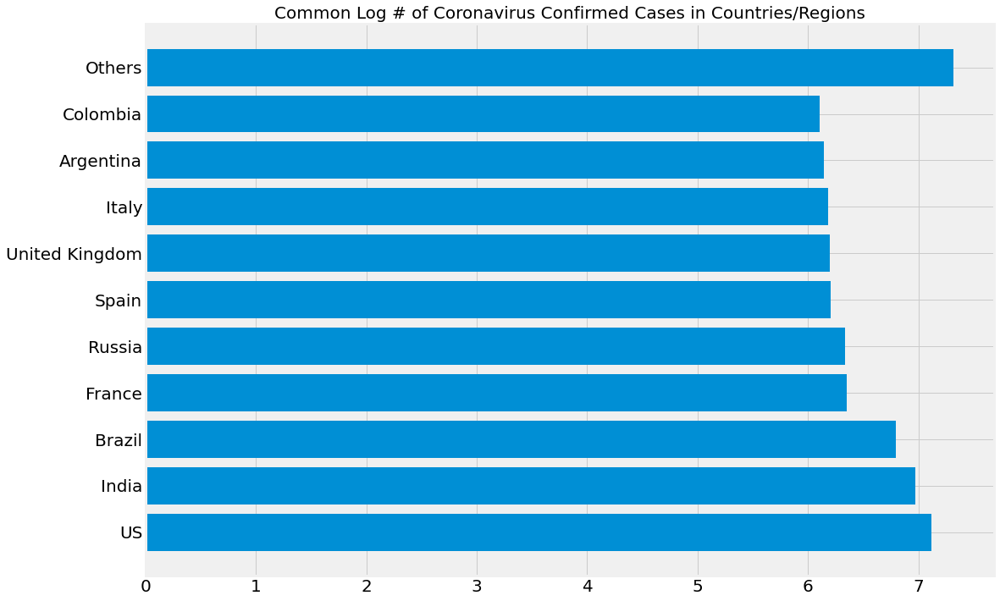

In [69]:
log_country_confirmed_cases = [math.log10(i) for i in visual_confirmed_cases]
plot_bar_graphs(visual_unique_countries, log_country_confirmed_cases, 'Common Log # of Coronavirus Confirmed Cases in Countries/Regions')

In [70]:
# Only show 10 provinces with the most confirmed cases, the rest are grouped into the other category
visual_unique_provinces = [] 
visual_confirmed_cases2 = []
others = np.sum(province_confirmed_cases[10:])
for i in range(len(province_confirmed_cases[:10])):
    visual_unique_provinces.append(unique_provinces[i])
    visual_confirmed_cases2.append(province_confirmed_cases[i])

visual_unique_provinces.append('Others')
visual_confirmed_cases2.append(others)

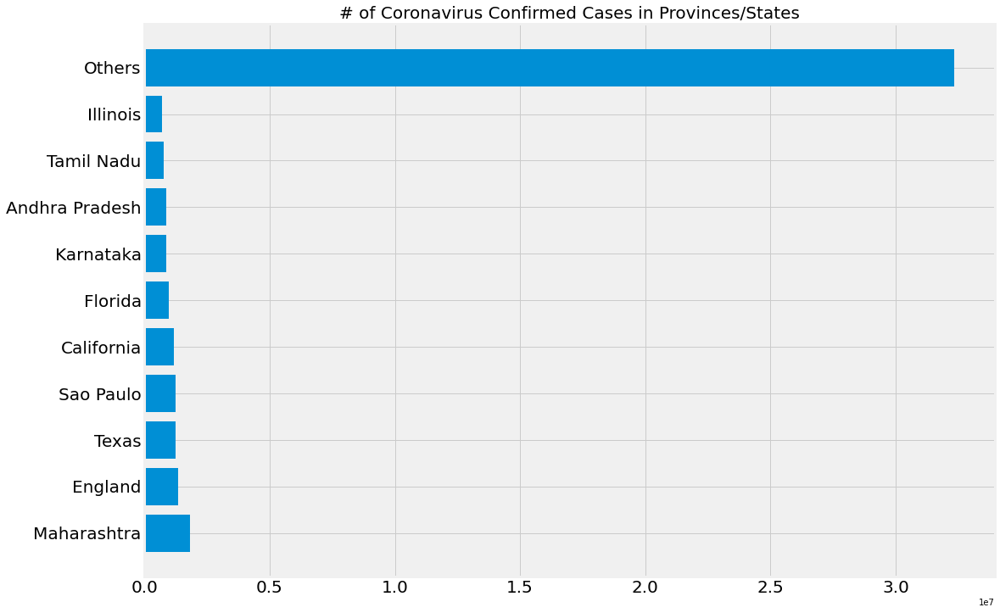

In [71]:
plot_bar_graphs(visual_unique_provinces, visual_confirmed_cases2, '# of Coronavirus Confirmed Cases in Provinces/States')

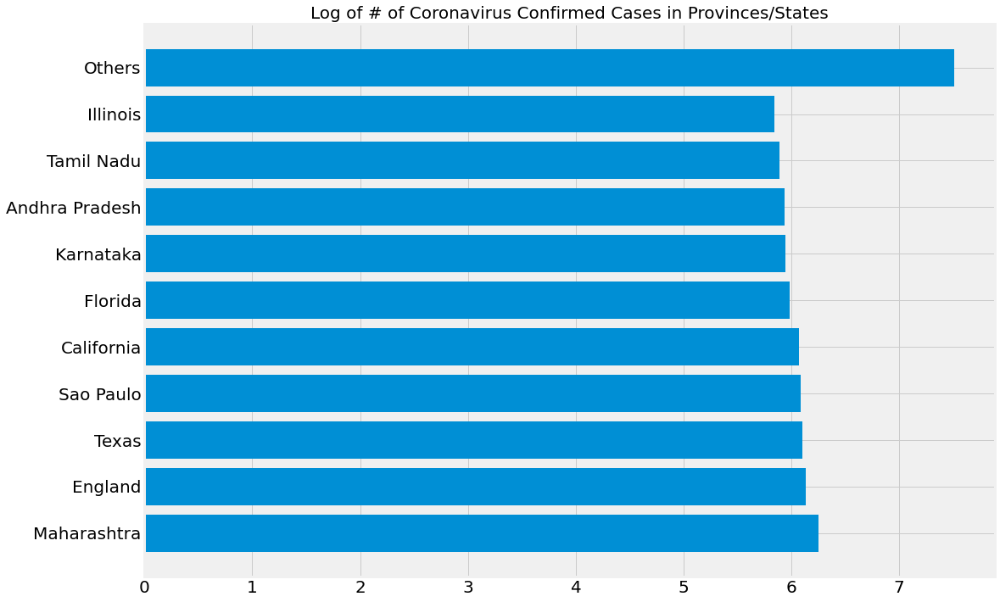

In [72]:
log_province_confirmed_cases = [math.log10(i) for i in visual_confirmed_cases2]
plot_bar_graphs(visual_unique_provinces, log_province_confirmed_cases, 'Log of # of Coronavirus Confirmed Cases in Provinces/States')

<a id='pie_charts'></a>
# Pie Chart Visualizations for COVID-19

In [73]:
def plot_pie_charts(x, y, title):
    # more muted color 
    c = ['lightcoral', 'rosybrown', 'sandybrown', 'navajowhite', 'gold',
        'khaki', 'lightskyblue', 'turquoise', 'lightslategrey', 'thistle', 'pink']
    plt.figure(figsize=(20,15))
    plt.title(title, size=20)
    plt.pie(y, colors=c,shadow=True, labels=y)
    plt.legend(x, loc='best', fontsize=12)
    plt.show()

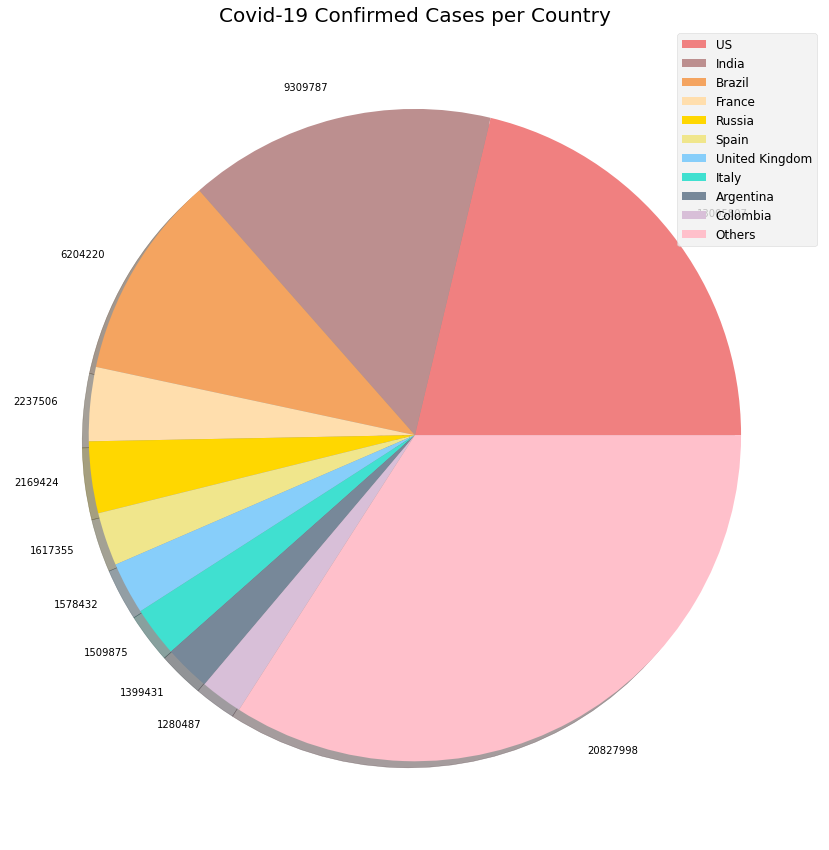

In [74]:
plot_pie_charts(visual_unique_countries, visual_confirmed_cases, 'Covid-19 Confirmed Cases per Country')

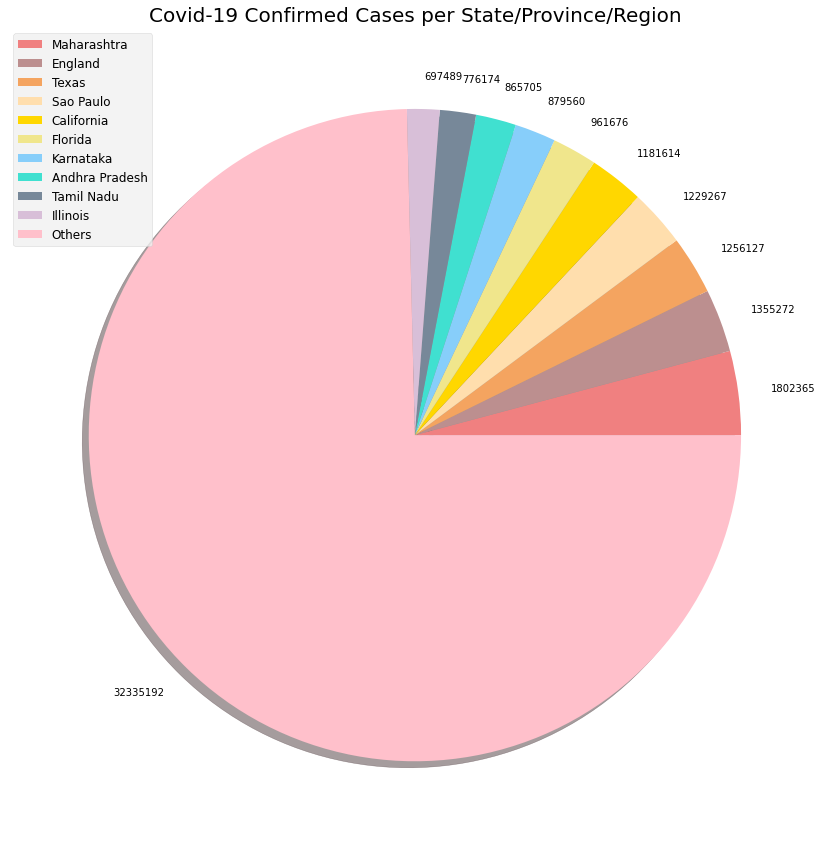

In [75]:
plot_pie_charts(visual_unique_provinces, visual_confirmed_cases2, 'Covid-19 Confirmed Cases per State/Province/Region')

In [76]:
# Plotting countries with regional data using a pie chart 

def plot_pie_country_with_regions(country_name, title):
    regions = list(latest_data[latest_data['Country_Region']==country_name]['Province_State'].unique())
    confirmed_cases = []
    no_cases = [] 
    for i in regions:
        cases = latest_data[latest_data['Province_State']==i]['Confirmed'].sum()
        if cases > 0:
            confirmed_cases.append(cases)
        else:
            no_cases.append(i)

    # remove areas with no confirmed cases
    for i in no_cases:
        regions.remove(i)

    # only show the top 5 states
    regions = [k for k, v in sorted(zip(regions, confirmed_cases), key=operator.itemgetter(1), reverse=True)]

    for i in range(len(regions)):
        confirmed_cases[i] = latest_data[latest_data['Province_State']==regions[i]]['Confirmed'].sum()  
    
    # additional province/state will be considered "others"
    
    if(len(regions)>5):
        regions_5 = regions[:5]
        regions_5.append('Others')
        confirmed_cases_5 = confirmed_cases[:5]
        confirmed_cases_5.append(np.sum(confirmed_cases[5:]))
        plot_pie_charts(regions_5,confirmed_cases_5, title)
    else:
        plot_pie_charts(regions,confirmed_cases, title)

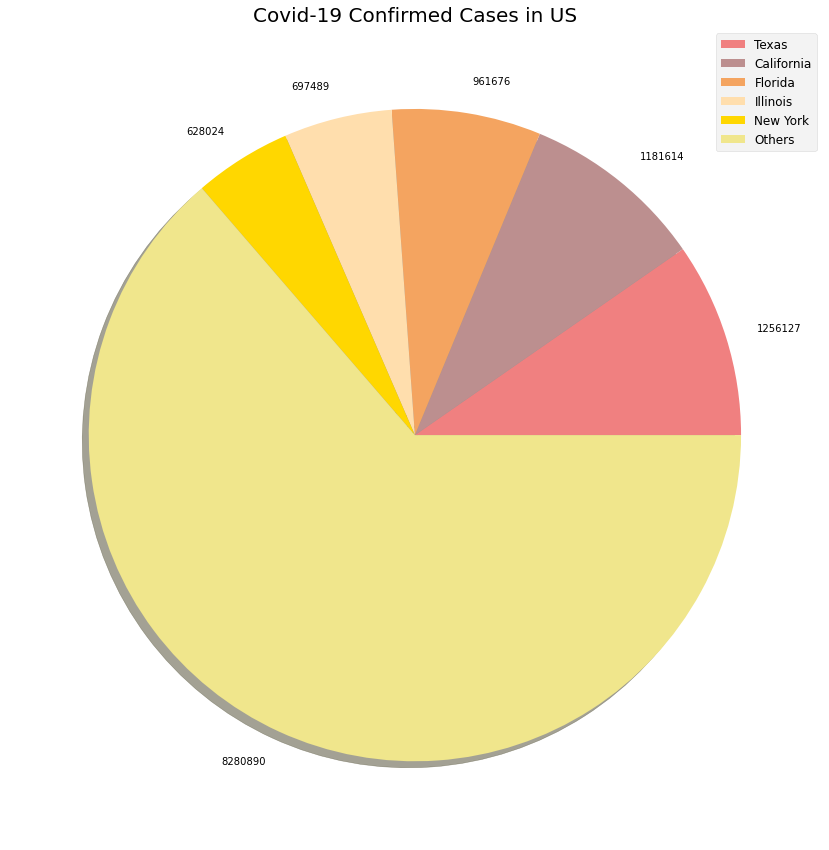

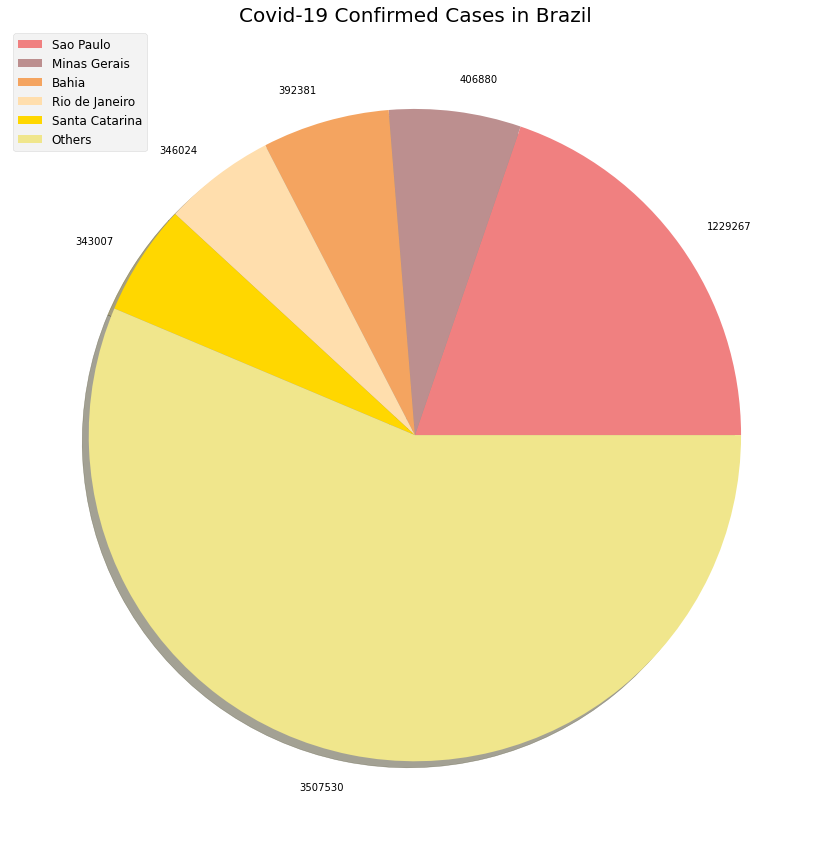

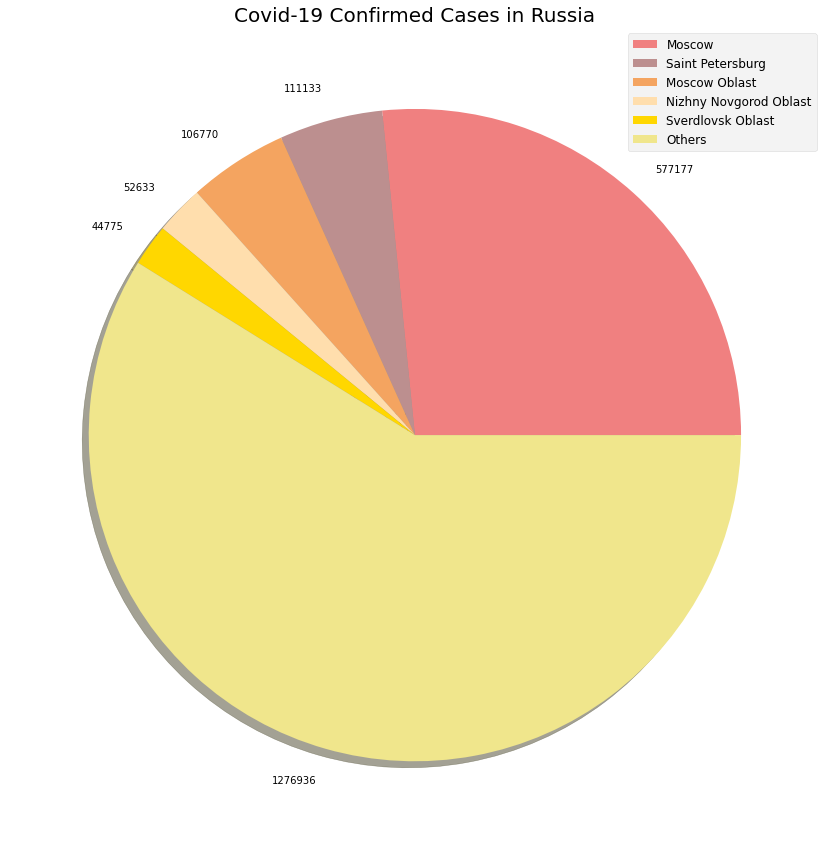

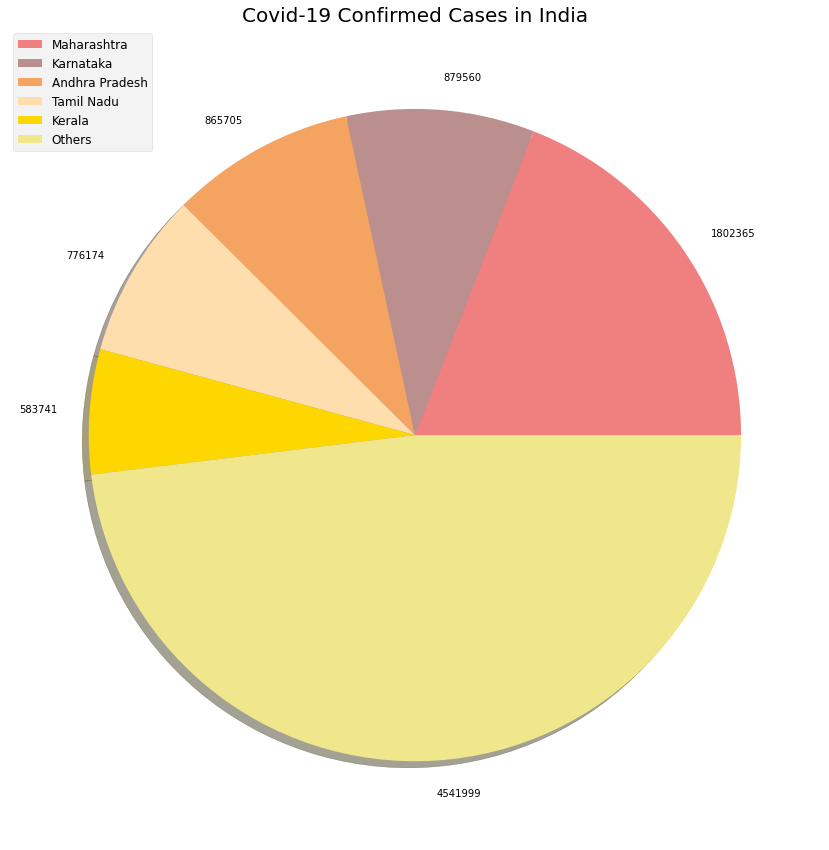

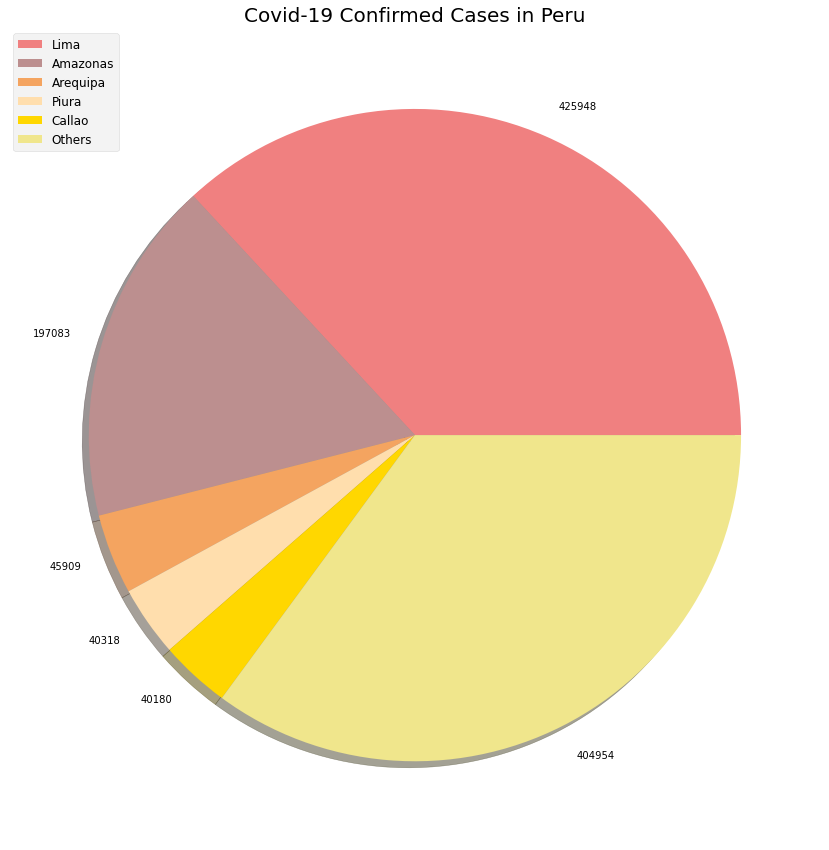

...

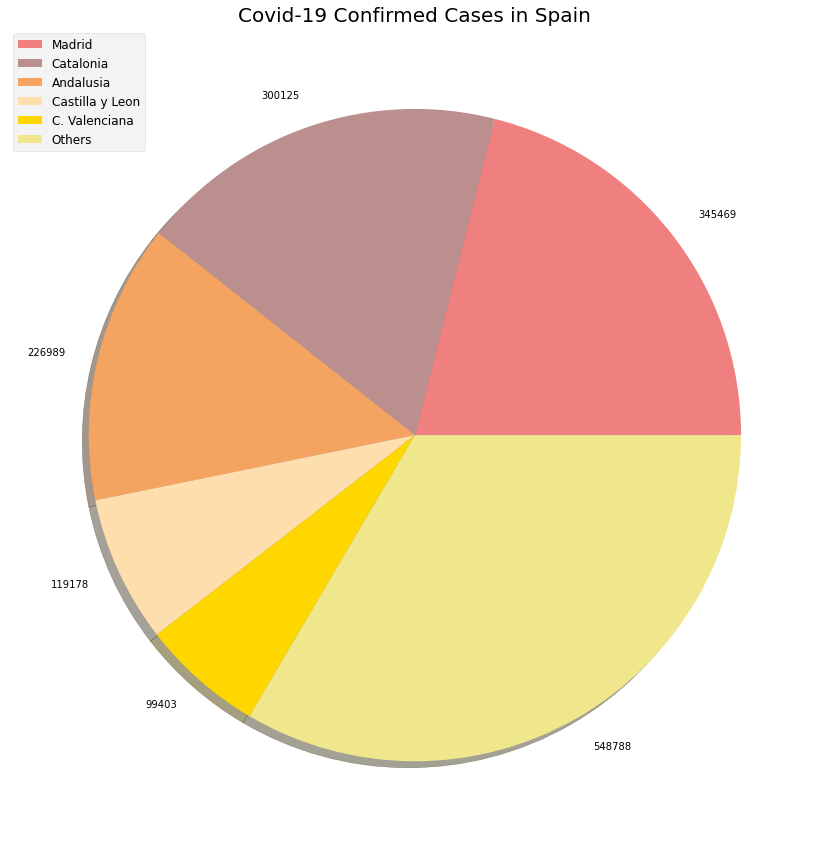

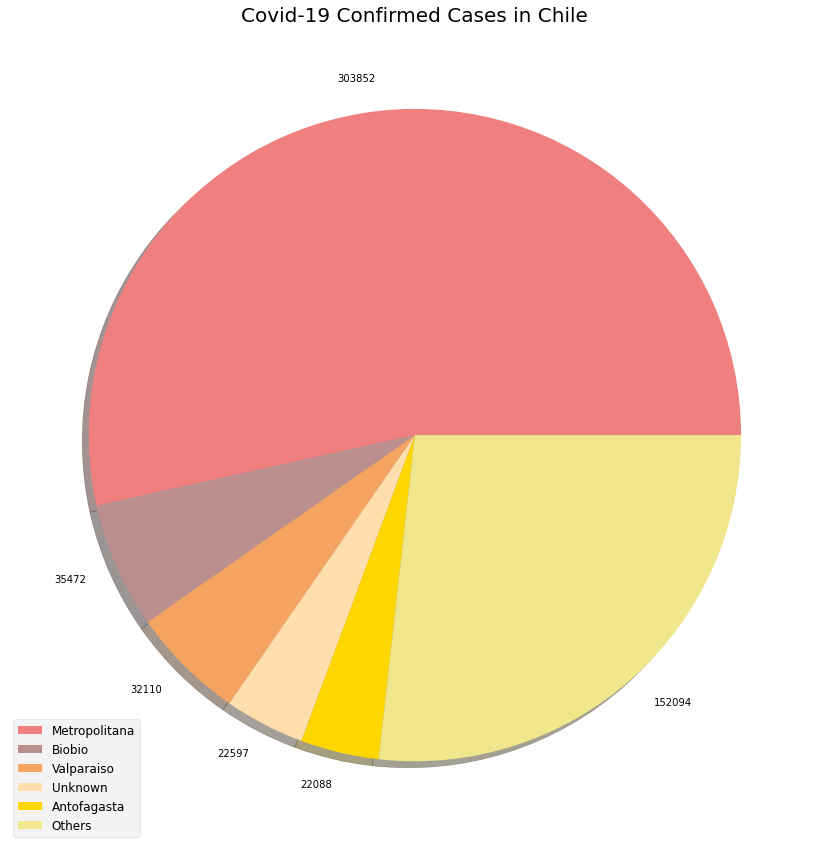

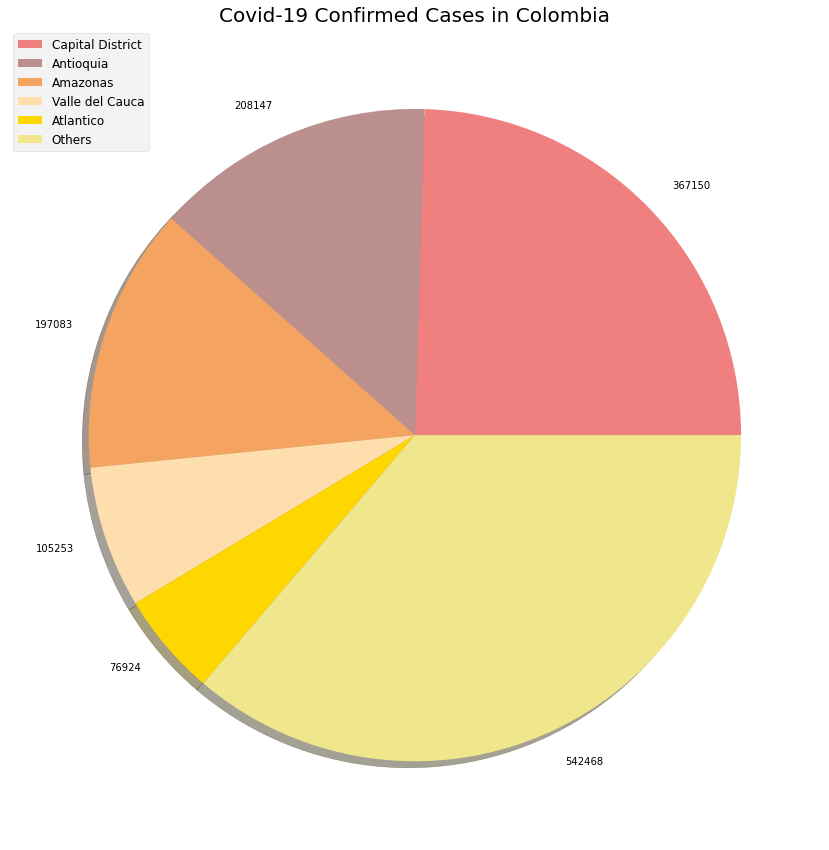

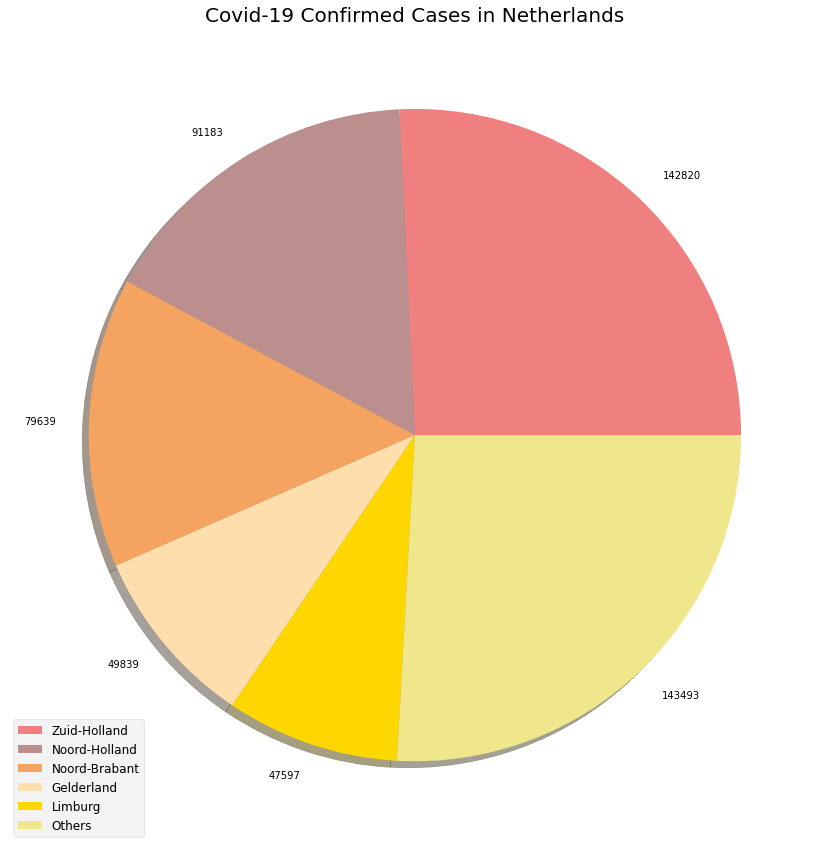

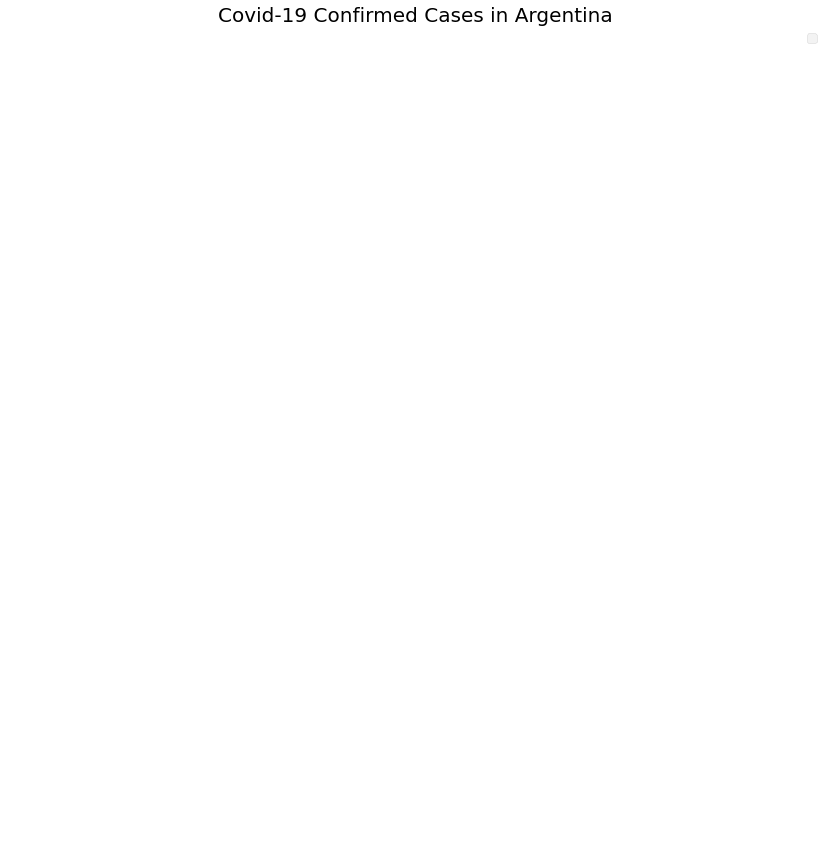

In [77]:
pie_chart_countries = ['US', 'Brazil', 'Russia', 'India', 'Peru', 'Mexico', 'Canada', 
                       'Australia', 'China', 'Italy', 'Germany', 'France', 'United Kingdom', 'Spain', 'Chile', 'Colombia', 'Netherlands', 'Argentina']

for i in pie_chart_countries:
    plot_pie_country_with_regions(i, 'Covid-19 Confirmed Cases in {}'.format(i))